# ONT Confidane score - Plot browser - no Threshold_mC
## T cells mapped to T2T version 2.0
## Pipeline to Extract and Analyze mC profiles from BAM files and look at Forward & Reverse strands

Modify the window of the input size

In [1]:
import sys
from pathlib import Path
from datetime import datetime 

# Add the folder containing 'my_functions.py' to sys.path
sys.path.append("/home/michalula/code/epiCausality/epiCode/utils/") # str(Path(__file__).parent / 'utils'))

# Import the module or specific functions
# from /home/michalula/code/epiCausality/epiCode/utils/funcs_extract_mC_profiles_from_BAMs.py
# from funcs_extract_mC_profiles_from_BAMs import system_info, extract_from_bam
from funcs_extract_mC_profiles_from_BAMs import (
    system_info,
    get_reference_sequence,
    create_output_directory,
    extract_from_bam,
    process_extracted_reads,
    visualize_data,
    create_padded_reads,
    plot_padded_reads,
    save_padded_reads,
    process_extracted_reads_no_fully_unmethylated,
    create_padded_reads_no_fully_unmethylated,
    mod_vectors_noThreshold_analyze
    # main,
)

modkit found with expected version 0.2.4


In [2]:
from funcs_analize_forward_reverse_extracted_mC_reads import analize_forward_reverse_CGs_pipeline

## Extract Extranded window around the 30 bp ROI of unedited primary T cells from Elain ES from nCATs nanopore experiment using P2 on 2004-12-16

## Setting mC threshold in methylation calling confidance to 0.7

# Expend window size

In [3]:
threshold_mC = None # 0.7 #  0.9 #0.99

system_info()

experiment_name = "ThrNone_unedited_Tcells_ES_NoFullyUnmethylated_T2Tv2"
bam_path = "/home/michalula/data/cas9_nanopore/data/20241226_MR_nCATs_TcellsPrES_unedit_P2R9/passed_fast5/5mCG/to_t2t_v2_0/sort_align_t2t_v2_0_trim_20241226_MR_nCATs_TcellsPrES_unedit_P2R9_passed.dna_r9.4.1_e8_sup@v3.3.5mCG.bam"
# bam_path = "/home/michalula/data/cas9_nanopore/data/20241226_nCATs_K562_ZFPOFFpostSort_LOW70/pod5_converted_basecall/5mCG/to_t2t_v2_0/sort_align_t2t_v2_0_trim_20241226_nCATs_K562_ZFPOFFpostSort_LOW70_R9min_converted_fast5.dna_r9.4.1_e8_sup@v3.3.5mCG.bam"
# "/home/michalula/data/cas9_nanopore/data/20241226_nCATs_K562_ZFPOFFpostSort_LOW70/pod5_converted_basecall/5mCG/to_t2t_v1_1/sort_align_t2t_v1_1_trim_20241226_nCATs_K562_ZFPOFFpostSort_LOW70_R9min_converted_fast5.dna_r9.4.1_e8_sup@v3.3.5mCG.bam"
#  "/home/michalula/data/cas9_nanopore/data/20241226_MR_nCATs_TcellsPrES_unedit_P2R9/passed_fast5/5mCG/to_t2t_v1_1/sort_align_trim_20241226_MR_nCATs_TcellsPrES_unedit_P2R9_passed.dna_r9.4.1_e8_sup@v3.3.5mCG.bam"

date_today = datetime.today().strftime('%Y-%m-%d')

# Make sure to use UpperCase fasta in the Reference genome, so that the mapping of the sequence is got giving erorrs
# awk '{if ($0 ~ /^>/) print $0; else print toupper($0)}' /home/michalula/data/ref_genomes/t2t_v2_0/chm13v2.0.fa > /home/michalula/data/ref_genomes/t2t_v2_0/up_chm13v2.0.fasta
# samtools faidx /home/michalula/data/ref_genomes/t2t_v2_0/up_chm13v2.0.fasta
ref_genome_path = Path('/home/michalula/data/ref_genomes/t2t_v2_0/up_chm13v2.0.fasta')
# '/home/michalula/data/ref_genomes/t2t_v2_0/chm13v2.0.fa')
reg_genome_version = "t2t_v2_0"
# t2t_v1_1_cd55_30bps = 'chr1:206586162-206586192'
region_chr = 'chr1'

# Expend window size
expand_window_size = 50 # 50 #500 #1500 # 0 
expand_window_size
print("Expend window size by 2 * ", expand_window_size)
region_start = 206586162 - expand_window_size
region_end = 206586192 + expand_window_size + 1

# # 30 bps:
# region_start = 206586162
# region_end = 206586192

# # FULL 7 KB WINDOW: 1:206583000-206590000
# region_start = 206583000   # 206586162
# region_end = 206590000 # 20658619

region_str = region_chr + ":" + str(region_start) + "-" + str(region_end) #'chr1:206586162-206586192'
region_length = region_end - region_start
print("region_length", region_length)


save_padded_reads_name_np = f"padded_reads_{experiment_name}_mCthresh{threshold_mC}_{reg_genome_version}_{region_str}_{date_today}.npy"
output_dir = create_output_directory("./dimelo_v2_output")

motifs=['CG,0']
ref_seq_list = get_reference_sequence(ref_genome_path, region_chr, region_start, region_end)

print('region_chr', region_chr)
print('region_start', region_start)
print('region_end', region_end)
print(f'{region_chr}:{region_start}-{region_end}')

System: Linux
Release: 6.8.0-60-generic
Version: #63~22.04.1-Ubuntu SMP PREEMPT_DYNAMIC Tue Apr 22 19:00:15 UTC 2
Processor: x86_64
Python version: 3.11.9 | packaged by conda-forge | (main, Apr 19 2024, 18:36:13) [GCC 12.3.0]
Expend window size by 2 *  50
region_length 131
ACCATTCAGCGTTTTGGGGTCTGTTTGTTTTTATTGTTATCCCACCCCACACCGCCCCGAGGCGCGCGCGCGCGCGCGCACACACACACACACACACACACACACACATACACACACGCACACTGGTGAAT
131
region_chr chr1
region_start 206586112
region_end 206586243
chr1:206586112-206586243


In [4]:
# threshold_mC = None # 0 # 0.7 # 0.9 #0.99

extract_file, extract_regions, fig_plot_browser = extract_from_bam(
    experiment_name=experiment_name, 
    bam_path=bam_path,
    ref_genome_file=ref_genome_path,
    output_dir=output_dir,
    regions=region_str,
    motifs=motifs,
    output_name='extracted_reads',
    threshold_mC=threshold_mC,
)

Region length: 131
No specified number of cores requested. 24 available on machine, allocating all.
No valid base modification threshold provided. Raw probs will be saved.


          | Step 1: Identify motif locations in up_chm13v2.0.fasta   0% | 00:00

          | Step 2: Parse regions in sort_align_t2t_v2_0_trim_20241226_MR_nCATs_TcellsPrES_unedit_P2R9_passed.…

          |    0%

          | Transferring 3007 from reads.CG,0.txt into reads.combined_basemods.h5, new size 3007   0% | 00:00<…

Plot browser html figure saved to dimelo_v2_output/plot_browser_131bps_ThrNone_unedited_Tcells_ES_NoFullyUnmethylated_T2Tv2_extract_reads_chr1:206586112-206586243.html


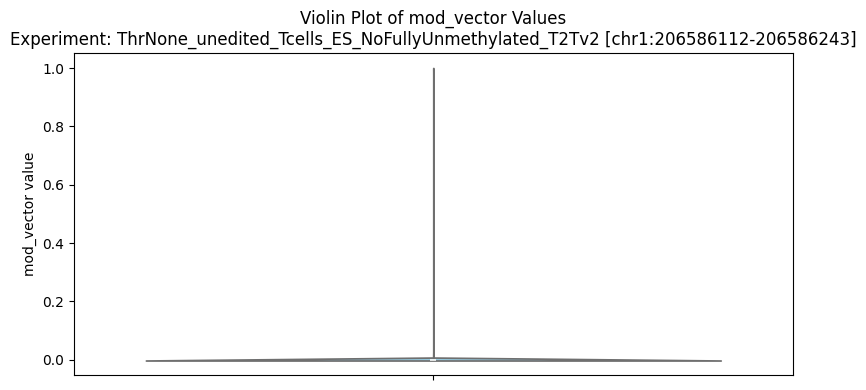

Bin 1: Range [0.0020, 0.0219) - Percentage: 39.50%
Bin 2: Range [0.0219, 0.0418) - Percentage: 4.91%
Bin 3: Range [0.0418, 0.0617) - Percentage: 3.10%
Bin 4: Range [0.0617, 0.0817) - Percentage: 2.37%
Bin 5: Range [0.0817, 0.1016) - Percentage: 1.69%
Bin 6: Range [0.1016, 0.1215) - Percentage: 1.42%
Bin 7: Range [0.1215, 0.1415) - Percentage: 1.21%
Bin 8: Range [0.1415, 0.1614) - Percentage: 1.12%
Bin 9: Range [0.1614, 0.1813) - Percentage: 1.10%
Bin 10: Range [0.1813, 0.2012) - Percentage: 0.93%
Bin 11: Range [0.2012, 0.2212) - Percentage: 1.02%
Bin 12: Range [0.2212, 0.2411) - Percentage: 0.90%
Bin 13: Range [0.2411, 0.2610) - Percentage: 0.80%
Bin 14: Range [0.2610, 0.2810) - Percentage: 0.80%
Bin 15: Range [0.2810, 0.3008) - Percentage: 0.70%
Bin 16: Range [0.3008, 0.3208) - Percentage: 0.77%
Bin 17: Range [0.3208, 0.3408) - Percentage: 0.67%
Bin 18: Range [0.3408, 0.3606) - Percentage: 0.60%
Bin 19: Range [0.3606, 0.3806) - Percentage: 0.66%
Bin 20: Range [0.3806, 0.4004) - Percen

([('chr1',
   array([0.      , 0.      , 0.      , ..., 0.      , 0.      , 0.009766],
         dtype=float16),
   'CG,0',
   np.int32(206589906),
   '70716b3a-2687-497e-aec2-2437dfefae48',
   np.int32(206580868),
   '-',
   array([0, 0, 0, ..., 0, 0, 1]),
   206586112,
   206586243,
   '.',
   np.float64(0.0810546875)),
  ('chr1',
   array([0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.1543], dtype=float16),
   'CG,0',
   np.int32(206589921),
   '725648dd-2bba-438a-90af-ed194c97f6a6',
   np.int32(206582396),
   '-',
   array([0, 0, 0, ..., 0, 0, 1]),
   206586112,
   206586243,
   '.',
   np.float64(0.2740885416666667)),
  ('chr1',
   array([0.   , 0.   , 0.   , ..., 0.   , 0.   , 0.166], dtype=float16),
   'CG,0',
   np.int32(206589899),
   '8af377a7-1457-4903-88e4-3687a74fb360',
   np.int32(206582555),
   '-',
   array([0, 0, 0, ..., 0, 0, 1]),
   206586112,
   206586243,
   '.',
   np.float64(0.2016059027777778)),
  ('chr1',
   array([0.    , 0.    , 0.    , ..., 0.    , 0.    , 0

In [5]:
num_bins = 50
mod_vectors_noThreshold_analyze(
    experiment_name,
    extract_file, # bam_path,
    region_str,
    motifs,
    num_bins
    )

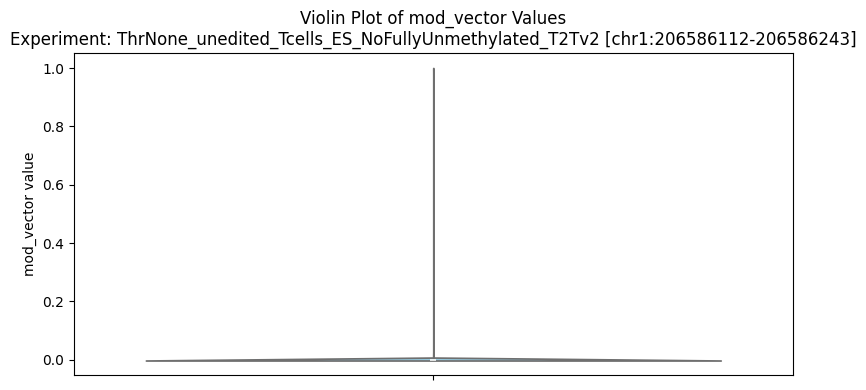

Bin 1: Range [0.0020, 0.0642) - Percentage: 47.51%
Bin 2: Range [0.0642, 0.1265) - Percentage: 5.72%
Bin 3: Range [0.1265, 0.1887) - Percentage: 3.55%
Bin 4: Range [0.1887, 0.2510) - Percentage: 2.83%
Bin 5: Range [0.2510, 0.3132) - Percentage: 2.43%
Bin 6: Range [0.3132, 0.3755) - Percentage: 2.12%
Bin 7: Range [0.3755, 0.4377) - Percentage: 1.98%
Bin 8: Range [0.4377, 0.5000) - Percentage: 1.86%
Bin 9: Range [0.5000, 0.5625) - Percentage: 1.80%
Bin 10: Range [0.5625, 0.6245) - Percentage: 1.72%
Bin 11: Range [0.6245, 0.6865) - Percentage: 1.60%
Bin 12: Range [0.6865, 0.7490) - Percentage: 1.61%
Bin 13: Range [0.7490, 0.8115) - Percentage: 1.82%
Bin 14: Range [0.8115, 0.8735) - Percentage: 2.06%
Bin 15: Range [0.8735, 0.9355) - Percentage: 2.31%
Bin 16: Range [0.9355, 0.9980) - Percentage: 19.09%


([('chr1',
   array([0.      , 0.      , 0.      , ..., 0.      , 0.      , 0.009766],
         dtype=float16),
   'CG,0',
   np.int32(206589906),
   '70716b3a-2687-497e-aec2-2437dfefae48',
   np.int32(206580868),
   '-',
   array([0, 0, 0, ..., 0, 0, 1]),
   206586112,
   206586243,
   '.',
   np.float64(0.0810546875)),
  ('chr1',
   array([0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.1543], dtype=float16),
   'CG,0',
   np.int32(206589921),
   '725648dd-2bba-438a-90af-ed194c97f6a6',
   np.int32(206582396),
   '-',
   array([0, 0, 0, ..., 0, 0, 1]),
   206586112,
   206586243,
   '.',
   np.float64(0.2740885416666667)),
  ('chr1',
   array([0.   , 0.   , 0.   , ..., 0.   , 0.   , 0.166], dtype=float16),
   'CG,0',
   np.int32(206589899),
   '8af377a7-1457-4903-88e4-3687a74fb360',
   np.int32(206582555),
   '-',
   array([0, 0, 0, ..., 0, 0, 1]),
   206586112,
   206586243,
   '.',
   np.float64(0.2016059027777778)),
  ('chr1',
   array([0.    , 0.    , 0.    , ..., 0.    , 0.    , 0

In [6]:
num_bins = 16
mod_vectors_noThreshold_analyze(
    experiment_name,
    extract_file, # bam_path,
    region_str,
    motifs,
    num_bins
    )

In [7]:
extract_file

PosixPath('dimelo_v2_output/extracted_reads/reads.combined_basemods.h5')

region_length 7000
Region length: 7000
No specified number of cores requested. 24 available on machine, allocating all.
No valid base modification threshold provided. Raw probs will be saved.


          | Step 1: Identify motif locations in up_chm13v2.0.fasta   0% | 00:00

          | Step 2: Parse regions in sort_align_t2t_v2_0_trim_20241226_MR_nCATs_TcellsPrES_unedit_P2R9_passed.…

          |    0%

          | Transferring 3574 from reads.CG,0.txt into reads.combined_basemods.h5, new size 3574   0% | 00:00<…

Plot browser html figure saved to dimelo_v2_output/plot_browser_7000bps_ThrNone_unedited_Tcells_ES_NoFullyUnmethylated_T2Tv2_extract_reads_chr1:206583000-206590000.html


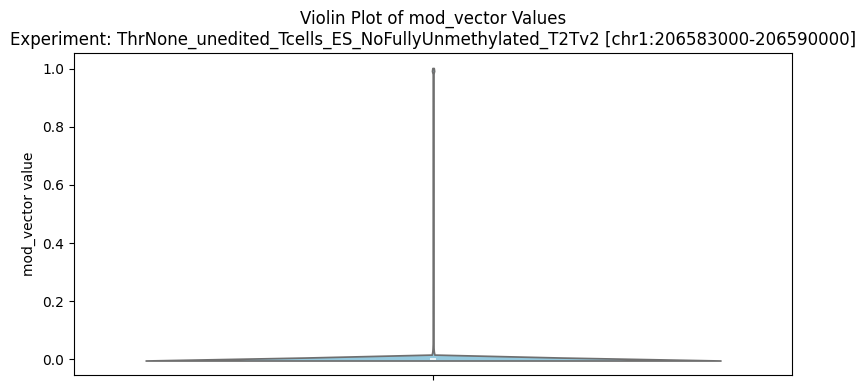

Bin 1: Range [0.0020, 0.0642) - Percentage: 55.29%
Bin 2: Range [0.0642, 0.1265) - Percentage: 5.05%
Bin 3: Range [0.1265, 0.1887) - Percentage: 2.82%
Bin 4: Range [0.1887, 0.2510) - Percentage: 2.03%
Bin 5: Range [0.2510, 0.3132) - Percentage: 1.62%
Bin 6: Range [0.3132, 0.3755) - Percentage: 1.37%
Bin 7: Range [0.3755, 0.4377) - Percentage: 1.28%
Bin 8: Range [0.4377, 0.5000) - Percentage: 1.17%
Bin 9: Range [0.5000, 0.5625) - Percentage: 1.12%
Bin 10: Range [0.5625, 0.6245) - Percentage: 1.10%
Bin 11: Range [0.6245, 0.6865) - Percentage: 1.09%
Bin 12: Range [0.6865, 0.7490) - Percentage: 1.08%
Bin 13: Range [0.7490, 0.8115) - Percentage: 1.15%
Bin 14: Range [0.8115, 0.8735) - Percentage: 1.37%
Bin 15: Range [0.8735, 0.9355) - Percentage: 1.79%
Bin 16: Range [0.9355, 0.9980) - Percentage: 20.66%


([('chr1',
   array([0.   , 0.   , 0.   , ..., 0.   , 0.   , 0.998], dtype=float16),
   'CG,0',
   np.int32(206583155),
   '83c80a8e-2405-40a1-bd1a-9d9f8863c847',
   np.int32(206572896),
   '-',
   array([0, 0, 0, ..., 0, 0, 1]),
   206583000,
   206590000,
   '.',
   np.float64(0.998046875)),
  ('chr1',
   array([0.   , 0.   , 0.   , ..., 0.   , 0.   , 0.998], dtype=float16),
   'CG,0',
   np.int32(206583151),
   'ebd335fb-50df-43df-b043-8a63d686e18c',
   np.int32(206574357),
   '-',
   array([0, 0, 0, ..., 0, 0, 1]),
   206583000,
   206590000,
   '.',
   np.float64(0.998046875)),
  ('chr1',
   array([0.  , 0.  , 0.  , ..., 0.  , 0.  , 0.99], dtype=float16),
   'CG,0',
   np.int32(206583152),
   'bb79378b-63cc-49d3-bef5-73e92dc9e412',
   np.int32(206578695),
   '-',
   array([0, 0, 0, ..., 0, 0, 1]),
   206583000,
   206590000,
   '.',
   np.float64(0.990234375)),
  ('chr1',
   array([0.   , 0.   , 0.   , ..., 0.   , 0.   , 0.998], dtype=float16),
   'CG,0',
   np.int32(206589889),
 

In [8]:
# threshold_mC = None # 0 # 0.7 # 0.9 #0.99
# FULL 7 KB WINDOW: 1:206583000-206590000
region_start = 206583000   # 206586162
region_end = 206590000 # 20658619


region_str = region_chr + ":" + str(region_start) + "-" + str(region_end) #'chr1:206586162-206586192'
region_length = region_end - region_start
print("region_length", region_length)


extract_file, extract_regions, fig_plot_browser = extract_from_bam(
    experiment_name=experiment_name,
    bam_path=bam_path,
    ref_genome_file=ref_genome_path,
    output_dir=output_dir,
    regions=region_str,
    motifs=motifs,
    output_name='extracted_reads',
    threshold_mC=threshold_mC,
)
mod_vectors_noThreshold_analyze(
    experiment_name,
    extract_file, # bam_path,
    region_str,
    motifs
    )

In [9]:
extract_file, extract_regions

(PosixPath('dimelo_v2_output/extracted_reads/reads.combined_basemods.h5'),
 PosixPath('dimelo_v2_output/extracted_reads/regions.processed.bed'))

In [10]:
keep_unmethylated_reads = False

if extract_file:
    if keep_unmethylated_reads:
        reads_df, regions_dict = process_extracted_reads(extract_file, region_str, motifs, ref_seq_list)
        visualize_data(reads_df)

        padded_reads = create_padded_reads(reads_df, regions_dict, region_length)
    else:
        reads_df, regions_dict = process_extracted_reads_no_fully_unmethylated(extract_file, region_str, motifs, ref_seq_list)
        visualize_data(reads_df)
        padded_reads = create_padded_reads_no_fully_unmethylated(reads_df, regions_dict, region_length)
    if padded_reads is not None:
        plot_padded_reads(padded_reads, ref_seq_list)
        save_padded_reads(padded_reads, output_dir, save_padded_reads_name_np)

# if extract_file:
#     reads_df, regions_dict = process_extracted_reads(extract_file, region_str, motifs, ref_seq_list)
#     visualize_data(reads_df)

#     padded_reads = create_padded_reads(reads_df, regions_dict, region_length)
#     if padded_reads is not None:
#         plot_padded_reads(padded_reads, ref_seq_list)
#         save_padded_reads(padded_reads, output_dir, save_padded_reads_name_np)
 

Error processing extracted reads: No threshold has been applied to this .h5 single read data. You must provide a threshold using the thresh parameter in order to extract binarized modification arrays.
Error in visualization: 'NoneType' object has no attribute 'copy'
Error creating padded reads matrix: 'NoneType' object is not subscriptable


region_length 300
Region length: 300
No specified number of cores requested. 24 available on machine, allocating all.
No valid base modification threshold provided. Raw probs will be saved.


          | Step 1: Identify motif locations in up_chm13v2.0.fasta   0% | 00:00

          | Step 2: Parse regions in sort_align_t2t_v2_0_trim_20241226_MR_nCATs_TcellsPrES_unedit_P2R9_passed.…

          |    0%

          | Transferring 3006 from reads.CG,0.txt into reads.combined_basemods.h5, new size 3006   0% | 00:00<…

Plot browser html figure saved to dimelo_v2_output/plot_browser_300bps_ThrNone_unedited_Tcells_ES_NoFullyUnmethylated_T2Tv2_extract_reads_chr1:206586400-206586700.html


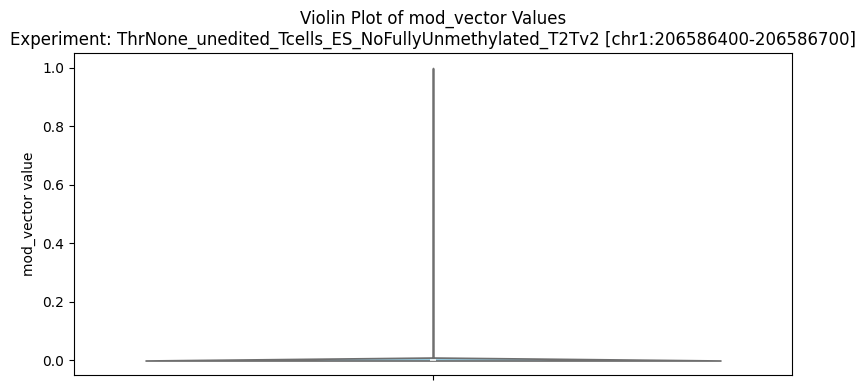

Bin 1: Range [0.0020, 0.0642) - Percentage: 74.59%
Bin 2: Range [0.0642, 0.1265) - Percentage: 6.49%
Bin 3: Range [0.1265, 0.1887) - Percentage: 3.50%
Bin 4: Range [0.1887, 0.2510) - Percentage: 2.31%
Bin 5: Range [0.2510, 0.3132) - Percentage: 1.67%
Bin 6: Range [0.3132, 0.3755) - Percentage: 1.34%
Bin 7: Range [0.3755, 0.4377) - Percentage: 1.33%
Bin 8: Range [0.4377, 0.5000) - Percentage: 1.13%
Bin 9: Range [0.5000, 0.5625) - Percentage: 1.04%
Bin 10: Range [0.5625, 0.6245) - Percentage: 1.00%
Bin 11: Range [0.6245, 0.6865) - Percentage: 0.95%
Bin 12: Range [0.6865, 0.7490) - Percentage: 0.87%
Bin 13: Range [0.7490, 0.8115) - Percentage: 0.82%
Bin 14: Range [0.8115, 0.8735) - Percentage: 0.93%
Bin 15: Range [0.8735, 0.9355) - Percentage: 0.74%
Bin 16: Range [0.9355, 0.9980) - Percentage: 1.30%


([('chr1',
   array([0.     , 0.     , 0.     , ..., 0.     , 0.     , 0.00586],
         dtype=float16),
   'CG,0',
   np.int32(206589925),
   '70716b3a-2687-497e-aec2-2437dfefae48',
   np.int32(206580887),
   '-',
   array([0, 0, 0, ..., 0, 0, 1]),
   206586400,
   206586700,
   '.',
   np.float64(0.031640625)),
  ('chr1',
   array([0.      , 0.      , 0.      , ..., 0.      , 0.      , 0.009766],
         dtype=float16),
   'CG,0',
   np.int32(206589918),
   '725648dd-2bba-438a-90af-ed194c97f6a6',
   np.int32(206582393),
   '-',
   array([0, 0, 0, ..., 0, 0, 1]),
   206586400,
   206586700,
   '.',
   np.float64(0.238671875)),
  ('chr1',
   array([0.      , 0.      , 0.      , ..., 0.      , 0.      , 0.009766],
         dtype=float16),
   'CG,0',
   np.int32(206589921),
   '8af377a7-1457-4903-88e4-3687a74fb360',
   np.int32(206582577),
   '-',
   array([0, 0, 0, ..., 0, 0, 1]),
   206586400,
   206586700,
   '.',
   np.float64(0.055989583333333336)),
  ('chr1',
   array([0.    , 0.

In [9]:
# Region length: 300 - TSS
region_start = 206586400 # 206583000   # 206586162
region_end = 206586700 # 206590000 # 20658619

region_str = region_chr + ":" + str(region_start) + "-" + str(region_end) #'chr1:206586162-206586192'
region_length = region_end - region_start
print("region_length", region_length)


extract_file, extract_regions, fig_plot_browser = extract_from_bam(
    experiment_name=experiment_name,
    bam_path=bam_path,
    ref_genome_file=ref_genome_path,
    output_dir=output_dir,
    regions=region_str,
    motifs=motifs,
    output_name='extracted_reads',
    threshold_mC=threshold_mC,
)
mod_vectors_noThreshold_analyze(
    experiment_name,
    extract_file, # bam_path,
    region_str,
    motifs
    )

region_length 310
Region length: 310
No specified number of cores requested. 24 available on machine, allocating all.
No valid base modification threshold provided. Raw probs will be saved.


          | Step 1: Identify motif locations in up_chm13v2.0.fasta   0% | 00:00

          | Step 2: Parse regions in sort_align_t2t_v2_0_trim_20241226_MR_nCATs_TcellsPrES_unedit_P2R9_passed.…

          |    0%

          | Transferring 3151 from reads.CG,0.txt into reads.combined_basemods.h5, new size 3151   0% | 00:00<…

Plot browser html figure saved to dimelo_v2_output/plot_browser_310bps_ThrNone_unedited_Tcells_ES_NoFullyUnmethylated_T2Tv2_extract_reads_chr1:206584106-206584416.html


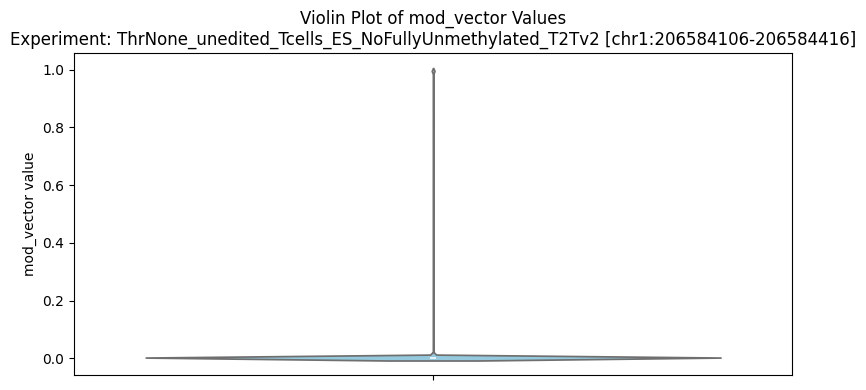

Bin 1: Range [0.0020, 0.0642) - Percentage: 2.56%
Bin 2: Range [0.0642, 0.1265) - Percentage: 0.62%
Bin 3: Range [0.1265, 0.1887) - Percentage: 0.67%
Bin 4: Range [0.1887, 0.2510) - Percentage: 0.64%
Bin 5: Range [0.2510, 0.3132) - Percentage: 0.75%
Bin 6: Range [0.3132, 0.3755) - Percentage: 0.96%
Bin 7: Range [0.3755, 0.4377) - Percentage: 0.86%
Bin 8: Range [0.4377, 0.5000) - Percentage: 1.02%
Bin 9: Range [0.5000, 0.5625) - Percentage: 1.21%
Bin 10: Range [0.5625, 0.6245) - Percentage: 1.42%
Bin 11: Range [0.6245, 0.6865) - Percentage: 1.62%
Bin 12: Range [0.6865, 0.7490) - Percentage: 1.87%
Bin 13: Range [0.7490, 0.8115) - Percentage: 2.11%
Bin 14: Range [0.8115, 0.8735) - Percentage: 3.36%
Bin 15: Range [0.8735, 0.9355) - Percentage: 5.22%
Bin 16: Range [0.9355, 0.9980) - Percentage: 75.10%


([('chr1',
   array([0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.9863], dtype=float16),
   'CG,0',
   np.int32(206589887),
   '70716b3a-2687-497e-aec2-2437dfefae48',
   np.int32(206580849),
   '-',
   array([0, 0, 0, ..., 0, 0, 1]),
   206584106,
   206584416,
   '.',
   np.float64(0.623046875)),
  ('chr1',
   array([0.     , 0.     , 0.     , ..., 0.     , 0.     , 0.06445],
         dtype=float16),
   'CG,0',
   np.int32(206589916),
   '725648dd-2bba-438a-90af-ed194c97f6a6',
   np.int32(206582391),
   '-',
   array([0, 0, 0, ..., 0, 0, 1]),
   206584106,
   206584416,
   '.',
   np.float64(0.7173295454545454)),
  ('chr1',
   array([0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.6855], dtype=float16),
   'CG,0',
   np.int32(206589888),
   '8af377a7-1457-4903-88e4-3687a74fb360',
   np.int32(206582544),
   '-',
   array([0, 0, 0, ..., 0, 0, 1]),
   206584106,
   206584416,
   '.',
   np.float64(0.8991477272727273)),
  ('chr1',
   array([0.  , 0.  , 0.  , ..., 0.  , 0.  , 0.99], dtype

In [10]:
# Highly methylated:

# Region length: 310
region_start = 206584106 # 206583000   # 206586162
region_end = 206584416 # 206587600 # 206590000 # 20658619

region_str = region_chr + ":" + str(region_start) + "-" + str(region_end) #'chr1:206586162-206586192'
region_length = region_end - region_start
print("region_length", region_length)


extract_file, extract_regions, fig_plot_browser = extract_from_bam(
    experiment_name=experiment_name,
    bam_path=bam_path,
    ref_genome_file=ref_genome_path,
    output_dir=output_dir,
    regions=region_str,
    motifs=motifs,
    output_name='extracted_reads',
    threshold_mC=threshold_mC,
)
mod_vectors_noThreshold_analyze(
    experiment_name,
    extract_file, # bam_path,
    region_str,
    motifs
    )

In [22]:
# # Region length: 2200 near TSS 
# region_start = 206585400 # 206583000   # 206586162
# region_end = 206587600 # 206590000 # 20658619

# region_str = region_chr + ":" + str(region_start) + "-" + str(region_end) #'chr1:206586162-206586192'
# region_length = region_end - region_start
# print("region_length", region_length)


# extract_file, extract_regions, fig_plot_browser = extract_from_bam(
#     experiment_name=experiment_name,
#     bam_path=bam_path,
#     ref_genome_file=ref_genome_path,
#     output_dir=output_dir,
#     regions=region_str,
#     motifs=motifs,
#     output_name='extracted_reads',
#     threshold_mC=threshold_mC,
# )
# mod_vectors_noThreshold_analyze(
#     experiment_name,
#     extract_file, # bam_path,
#     region_str,
#     motifs
#     )

In [23]:
206585797 - 206585797+1

1

region_length 1
Region length: 1
No specified number of cores requested. 24 available on machine, allocating all.
No valid base modification threshold provided. Raw probs will be saved.


          | Step 1: Identify motif locations in up_chm13v2.0.fasta   0% | 00:00

          | Step 2: Parse regions in sort_align_t2t_v2_0_trim_20241226_MR_nCATs_TcellsPrES_unedit_P2R9_passed.…

          |    0%

          | Transferring 1288 from reads.CG,0.txt into reads.combined_basemods.h5, new size 1288   0% | 00:00<…

Plot browser html figure saved to dimelo_v2_output/plot_browser_1bps_ThrNone_unedited_Tcells_ES_NoFullyUnmethylated_T2Tv2_extract_reads_chr1:206585797-206585798.html


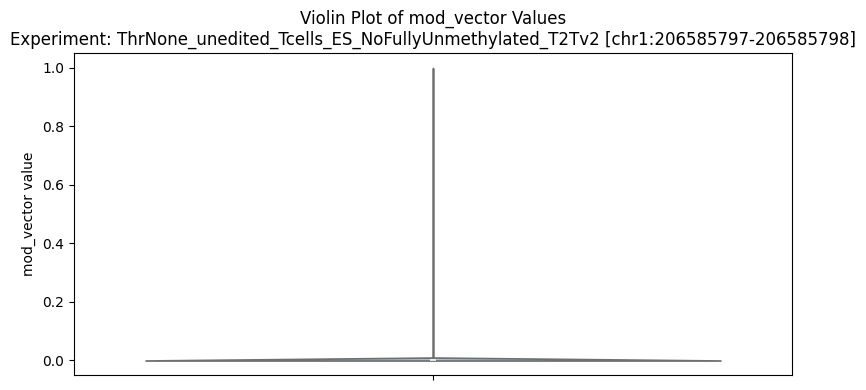

Bin 1: Range [0.0020, 0.0642) - Percentage: 18.32%
Bin 2: Range [0.0642, 0.1265) - Percentage: 1.16%
Bin 3: Range [0.1265, 0.1887) - Percentage: 0.70%
Bin 4: Range [0.1887, 0.2510) - Percentage: 0.23%
Bin 5: Range [0.2510, 0.3132) - Percentage: 0.70%
Bin 6: Range [0.3132, 0.3755) - Percentage: 0.23%
Bin 7: Range [0.3755, 0.4377) - Percentage: 0.39%
Bin 8: Range [0.4377, 0.5000) - Percentage: 0.47%
Bin 9: Range [0.5000, 0.5625) - Percentage: 1.16%
Bin 10: Range [0.5625, 0.6245) - Percentage: 0.47%
Bin 11: Range [0.6245, 0.6865) - Percentage: 1.01%
Bin 12: Range [0.6865, 0.7490) - Percentage: 1.40%
Bin 13: Range [0.7490, 0.8115) - Percentage: 1.79%
Bin 14: Range [0.8115, 0.8735) - Percentage: 2.25%
Bin 15: Range [0.8735, 0.9355) - Percentage: 5.36%
Bin 16: Range [0.9355, 0.9980) - Percentage: 64.36%


([('chr1',
   array([0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.0293], dtype=float16),
   'CG,0',
   np.int32(206589880),
   '0bead339-5858-4332-a5fb-de51d1fa3a2f',
   np.int32(206582689),
   '+',
   array([0, 0, 0, ..., 0, 0, 1]),
   206585797,
   206585798,
   '.',
   np.float64(0.029296875)),
  ('chr1',
   array([0.   , 0.   , 0.   , ..., 0.   , 0.   , 0.998], dtype=float16),
   'CG,0',
   np.int32(206589852),
   '7d30168d-6731-4643-ab9a-46eaa22bfb24',
   np.int32(206582920),
   '+',
   array([0, 0, 0, ..., 0, 0, 1]),
   206585797,
   206585798,
   '.',
   np.float64(0.998046875)),
  ('chr1',
   array([0.   , 0.   , 0.   , ..., 0.   , 0.   , 0.998], dtype=float16),
   'CG,0',
   np.int32(206589893),
   '758c660a-b26b-4b2b-9035-b8c77dbf51f5',
   np.int32(206583015),
   '+',
   array([0, 0, 0, ..., 0, 0, 1]),
   206585797,
   206585798,
   '.',
   np.float64(0.998046875)),
  ('chr1',
   array([0.   , 0.   , 0.   , ..., 0.   , 0.   , 0.998], dtype=float16),
   'CG,0',
   np.int32(2

In [24]:
# 206585797 - 206585797+1

# Intermediatly mC location TSS 
region_start = 206585797 # 206583000   # 206586162
region_end = 206585797+1 # 206590000 # 20658619

region_str = region_chr + ":" + str(region_start) + "-" + str(region_end) #'chr1:206586162-206586192'
region_length = region_end - region_start
print("region_length", region_length)


extract_file, extract_regions, fig_plot_browser = extract_from_bam(
    experiment_name=experiment_name,
    bam_path=bam_path,
    ref_genome_file=ref_genome_path,
    output_dir=output_dir,
    regions=region_str,
    motifs=motifs,
    output_name='extracted_reads',
    threshold_mC=threshold_mC,
)
mod_vectors_noThreshold_analyze(
    experiment_name,
    extract_file, # bam_path,
    region_str,
    motifs
    )

region_length 1
Region length: 1
No specified number of cores requested. 24 available on machine, allocating all.
No valid base modification threshold provided. Raw probs will be saved.


          | Step 1: Identify motif locations in up_chm13v2.0.fasta   0% | 00:00

          | Step 2: Parse regions in sort_align_t2t_v2_0_trim_20241226_MR_nCATs_TcellsPrES_unedit_P2R9_passed.…

          |    0%

          | Transferring 1316 from reads.CG,0.txt into reads.combined_basemods.h5, new size 1316   0% | 00:00<…

Plot browser html figure saved to dimelo_v2_output/plot_browser_1bps_ThrNone_unedited_Tcells_ES_NoFullyUnmethylated_T2Tv2_extract_reads_chr1:206584946-206584947.html


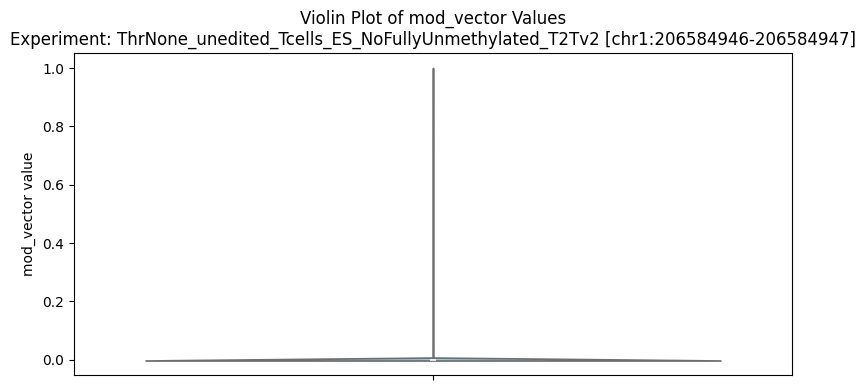

Bin 1: Range [0.0020, 0.0642) - Percentage: 6.00%
Bin 2: Range [0.0642, 0.1265) - Percentage: 0.84%
Bin 3: Range [0.1265, 0.1887) - Percentage: 0.23%
Bin 4: Range [0.1887, 0.2510) - Percentage: 0.38%
Bin 5: Range [0.2510, 0.3132) - Percentage: 0.15%
Bin 6: Range [0.3132, 0.3755) - Percentage: 0.30%
Bin 7: Range [0.3755, 0.4377) - Percentage: 0.23%
Bin 8: Range [0.4377, 0.5000) - Percentage: 0.76%
Bin 9: Range [0.5000, 0.5625) - Percentage: 0.38%
Bin 10: Range [0.5625, 0.6245) - Percentage: 0.46%
Bin 11: Range [0.6245, 0.6865) - Percentage: 0.53%
Bin 12: Range [0.6865, 0.7490) - Percentage: 0.76%
Bin 13: Range [0.7490, 0.8115) - Percentage: 0.91%
Bin 14: Range [0.8115, 0.8735) - Percentage: 1.37%
Bin 15: Range [0.8735, 0.9355) - Percentage: 2.28%
Bin 16: Range [0.9355, 0.9980) - Percentage: 84.42%


([('chr1',
   array([0.      , 0.      , 0.      , ..., 0.      , 0.      , 0.009766],
         dtype=float16),
   'CG,0',
   np.int32(206589868),
   '7d30168d-6731-4643-ab9a-46eaa22bfb24',
   np.int32(206582936),
   '+',
   array([0, 0, 0, ..., 0, 0, 1]),
   206584946,
   206584947,
   '.',
   np.float64(0.009765625)),
  ('chr1',
   array([0.   , 0.   , 0.   , ..., 0.   , 0.   , 0.994], dtype=float16),
   'CG,0',
   np.int32(206589869),
   '758c660a-b26b-4b2b-9035-b8c77dbf51f5',
   np.int32(206582991),
   '+',
   array([0, 0, 0, ..., 0, 0, 1]),
   206584946,
   206584947,
   '.',
   np.float64(0.994140625)),
  ('chr1',
   array([0.   , 0.   , 0.   , ..., 0.   , 0.   , 0.998], dtype=float16),
   'CG,0',
   np.int32(206589928),
   '25a1d5af-6916-4721-b10e-a5134230caa0',
   np.int32(206583016),
   '+',
   array([0, 0, 0, ..., 0, 0, 1]),
   206584946,
   206584947,
   '.',
   np.float64(0.998046875)),
  ('chr1',
   array([0.   , 0.   , 0.   , ..., 0.   , 0.   , 0.998], dtype=float16),
   

In [25]:
# High mC: 206584946 - 206584946+1
# Intermediate: 206585797 - 206585797+1

# Intermediatly mC location TSS 
region_start = 206584946 # 206583000   # 206586162
region_end = 206584946+1 # 206590000 # 20658619

region_str = region_chr + ":" + str(region_start) + "-" + str(region_end) #'chr1:206586162-206586192'
region_length = region_end - region_start
print("region_length", region_length)


extract_file, extract_regions, fig_plot_browser = extract_from_bam(
    experiment_name=experiment_name,
    bam_path=bam_path,
    ref_genome_file=ref_genome_path,
    output_dir=output_dir,
    regions=region_str,
    motifs=motifs,
    output_name='extracted_reads',
    threshold_mC=threshold_mC,
)
mod_vectors_noThreshold_analyze(
    experiment_name,
    extract_file, # bam_path,
    region_str,
    motifs
    )

region_length 1
Region length: 1
No specified number of cores requested. 24 available on machine, allocating all.
No valid base modification threshold provided. Raw probs will be saved.


          | Step 1: Identify motif locations in up_chm13v2.0.fasta   0% | 00:00

          | Step 2: Parse regions in sort_align_t2t_v2_0_trim_20241226_MR_nCATs_TcellsPrES_unedit_P2R9_passed.…

          |    0%

          | Transferring 1286 from reads.CG,0.txt into reads.combined_basemods.h5, new size 1286   0% | 00:00<…

Plot browser html figure saved to dimelo_v2_output/plot_browser_1bps_ThrNone_unedited_Tcells_ES_NoFullyUnmethylated_T2Tv2_extract_reads_chr1:206586718-206586719.html


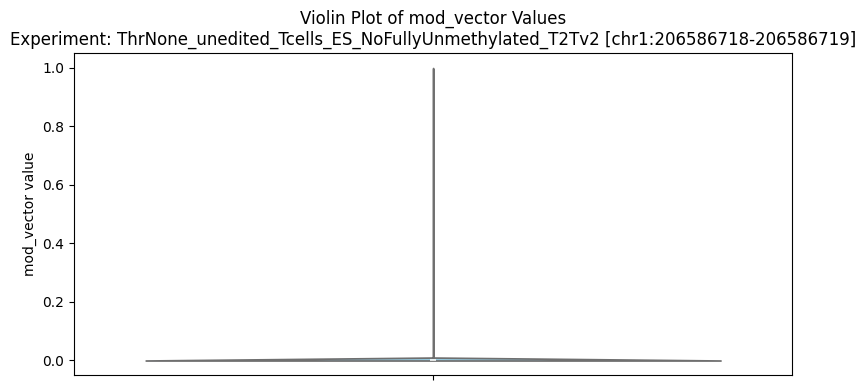

Bin 1: Range [0.0020, 0.0642) - Percentage: 76.75%
Bin 2: Range [0.0642, 0.1265) - Percentage: 6.92%
Bin 3: Range [0.1265, 0.1887) - Percentage: 3.58%
Bin 4: Range [0.1887, 0.2510) - Percentage: 2.72%
Bin 5: Range [0.2510, 0.3132) - Percentage: 1.48%
Bin 6: Range [0.3132, 0.3755) - Percentage: 0.78%
Bin 7: Range [0.3755, 0.4377) - Percentage: 1.48%
Bin 8: Range [0.4377, 0.5000) - Percentage: 1.32%
Bin 9: Range [0.5000, 0.5625) - Percentage: 0.86%
Bin 10: Range [0.5625, 0.6245) - Percentage: 0.47%
Bin 11: Range [0.6245, 0.6865) - Percentage: 0.78%
Bin 12: Range [0.6865, 0.7490) - Percentage: 0.16%
Bin 13: Range [0.7490, 0.8115) - Percentage: 0.86%
Bin 14: Range [0.8115, 0.8735) - Percentage: 0.31%
Bin 15: Range [0.8735, 0.9355) - Percentage: 0.39%
Bin 16: Range [0.9355, 0.9980) - Percentage: 1.17%


([('chr1',
   array([0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.1855], dtype=float16),
   'CG,0',
   np.int32(206589880),
   '0bead339-5858-4332-a5fb-de51d1fa3a2f',
   np.int32(206582689),
   '+',
   array([0, 0, 0, ..., 0, 0, 1]),
   206586718,
   206586719,
   '.',
   np.float64(0.185546875)),
  ('chr1',
   array([0.      , 0.      , 0.      , ..., 0.      , 0.      , 0.001953],
         dtype=float16),
   'CG,0',
   np.int32(206589922),
   'cd17f061-b00f-412a-a2eb-c22e00819ba9',
   np.int32(206582826),
   '+',
   array([0, 0, 0, ..., 0, 0, 1]),
   206586718,
   206586719,
   '.',
   np.float64(0.001953125)),
  ('chr1',
   array([0.      , 0.      , 0.      , ..., 0.      , 0.      , 0.001953],
         dtype=float16),
   'CG,0',
   np.int32(206589846),
   '7d30168d-6731-4643-ab9a-46eaa22bfb24',
   np.int32(206582914),
   '+',
   array([0, 0, 0, ..., 0, 0, 1]),
   206586718,
   206586719,
   '.',
   np.float64(0.001953125)),
  ('chr1',
   array([0.    , 0.    , 0.    , ..., 0.   

In [26]:
# High mC: 206584946 - 206584946+1
# Intermediate: 206585797 - 206585797+1
# Low mC (mid near TSS): 206586718 

# Intermediatly mC location TSS 
region_start = 206586718 # 206583000   # 206586162
region_end = 206586718+1 # 206590000 # 20658619

region_str = region_chr + ":" + str(region_start) + "-" + str(region_end) #'chr1:206586162-206586192'
region_length = region_end - region_start
print("region_length", region_length)


extract_file, extract_regions, fig_plot_browser = extract_from_bam(
    experiment_name=experiment_name,
    bam_path=bam_path,
    ref_genome_file=ref_genome_path,
    output_dir=output_dir,
    regions=region_str,
    motifs=motifs,
    output_name='extracted_reads',
    threshold_mC=threshold_mC,
)
mod_vectors_noThreshold_analyze(
    experiment_name,
    extract_file, # bam_path,
    region_str,
    motifs
    )

region_length 2
Region length: 2
No specified number of cores requested. 24 available on machine, allocating all.
No valid base modification threshold provided. Raw probs will be saved.


          | Step 1: Identify motif locations in up_chm13v2.0.fasta   0% | 00:00

          | Step 2: Parse regions in sort_align_t2t_v2_0_trim_20241226_MR_nCATs_TcellsPrES_unedit_P2R9_passed.…

          |    0%

          | Transferring 1286 from reads.CG,0.txt into reads.combined_basemods.h5, new size 1286   0% | 00:00<…

Plot browser html figure saved to dimelo_v2_output/plot_browser_2bps_ThrNone_unedited_Tcells_ES_NoFullyUnmethylated_T2Tv2_extract_reads_chr1:206586717-206586719.html


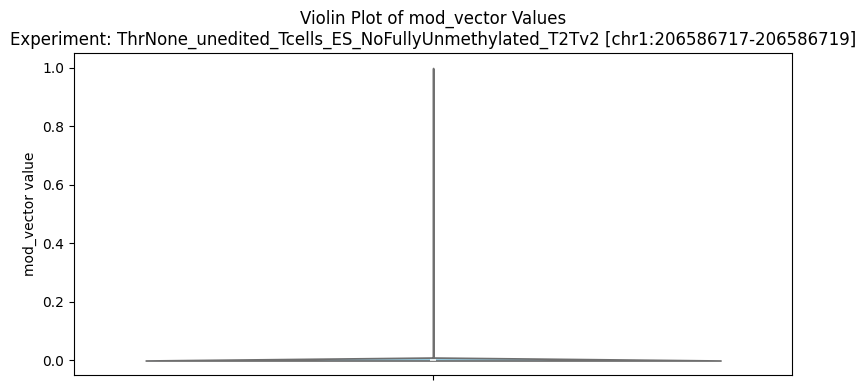

Bin 1: Range [0.0020, 0.0642) - Percentage: 76.75%
Bin 2: Range [0.0642, 0.1265) - Percentage: 6.92%
Bin 3: Range [0.1265, 0.1887) - Percentage: 3.58%
Bin 4: Range [0.1887, 0.2510) - Percentage: 2.72%
Bin 5: Range [0.2510, 0.3132) - Percentage: 1.48%
Bin 6: Range [0.3132, 0.3755) - Percentage: 0.78%
Bin 7: Range [0.3755, 0.4377) - Percentage: 1.48%
Bin 8: Range [0.4377, 0.5000) - Percentage: 1.32%
Bin 9: Range [0.5000, 0.5625) - Percentage: 0.86%
Bin 10: Range [0.5625, 0.6245) - Percentage: 0.47%
Bin 11: Range [0.6245, 0.6865) - Percentage: 0.78%
Bin 12: Range [0.6865, 0.7490) - Percentage: 0.16%
Bin 13: Range [0.7490, 0.8115) - Percentage: 0.86%
Bin 14: Range [0.8115, 0.8735) - Percentage: 0.31%
Bin 15: Range [0.8735, 0.9355) - Percentage: 0.39%
Bin 16: Range [0.9355, 0.9980) - Percentage: 1.17%


([('chr1',
   array([0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.1855], dtype=float16),
   'CG,0',
   np.int32(206589880),
   '0bead339-5858-4332-a5fb-de51d1fa3a2f',
   np.int32(206582689),
   '+',
   array([0, 0, 0, ..., 0, 0, 1]),
   206586717,
   206586719,
   '.',
   np.float64(0.185546875)),
  ('chr1',
   array([0.      , 0.      , 0.      , ..., 0.      , 0.      , 0.001953],
         dtype=float16),
   'CG,0',
   np.int32(206589922),
   'cd17f061-b00f-412a-a2eb-c22e00819ba9',
   np.int32(206582826),
   '+',
   array([0, 0, 0, ..., 0, 0, 1]),
   206586717,
   206586719,
   '.',
   np.float64(0.001953125)),
  ('chr1',
   array([0.      , 0.      , 0.      , ..., 0.      , 0.      , 0.001953],
         dtype=float16),
   'CG,0',
   np.int32(206589846),
   '7d30168d-6731-4643-ab9a-46eaa22bfb24',
   np.int32(206582914),
   '+',
   array([0, 0, 0, ..., 0, 0, 1]),
   206586717,
   206586719,
   '.',
   np.float64(0.001953125)),
  ('chr1',
   array([0.    , 0.    , 0.    , ..., 0.   

In [27]:
# High mC: 206584946 - 206584946+1
# Intermediate: 206585797 - 206585797+1
# Low mC (mid near TSS): 206586718 

# Intermediatly mC location TSS 
region_start = 206586718-1 # 206583000   # 206586162
region_end = 206586718+1 # 206590000 # 20658619

region_str = region_chr + ":" + str(region_start) + "-" + str(region_end) #'chr1:206586162-206586192'
region_length = region_end - region_start
print("region_length", region_length)


extract_file, extract_regions, fig_plot_browser = extract_from_bam(
    experiment_name=experiment_name,
    bam_path=bam_path,
    ref_genome_file=ref_genome_path,
    output_dir=output_dir,
    regions=region_str,
    motifs=motifs,
    output_name='extracted_reads',
    threshold_mC=threshold_mC,
)
mod_vectors_noThreshold_analyze(
    experiment_name,
    extract_file, # bam_path,
    region_str,
    motifs
    )

region_length 2
Region length: 2
No specified number of cores requested. 24 available on machine, allocating all.
No valid base modification threshold provided. Raw probs will be saved.


          | Step 1: Identify motif locations in up_chm13v2.0.fasta   0% | 00:00

          | Step 2: Parse regions in sort_align_t2t_v2_0_trim_20241226_MR_nCATs_TcellsPrES_unedit_P2R9_passed.…

          |    0%

          | Transferring 1323 from reads.CG,0.txt into reads.combined_basemods.h5, new size 1323   0% | 00:00<…

Plot browser html figure saved to dimelo_v2_output/plot_browser_2bps_ThrNone_unedited_Tcells_ES_NoFullyUnmethylated_T2Tv2_extract_reads_chr1:206586421-206586423.html


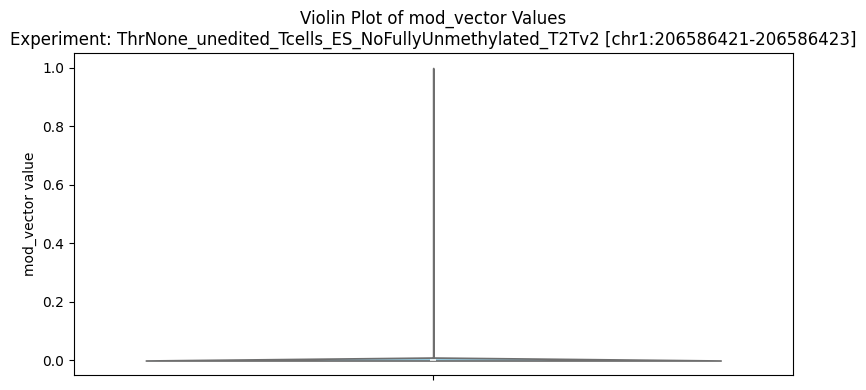

Bin 1: Range [0.0020, 0.0642) - Percentage: 80.42%
Bin 2: Range [0.0642, 0.1265) - Percentage: 6.65%
Bin 3: Range [0.1265, 0.1887) - Percentage: 2.87%
Bin 4: Range [0.1887, 0.2510) - Percentage: 1.81%
Bin 5: Range [0.2510, 0.3132) - Percentage: 1.59%
Bin 6: Range [0.3132, 0.3755) - Percentage: 0.98%
Bin 7: Range [0.3755, 0.4377) - Percentage: 0.91%
Bin 8: Range [0.4377, 0.5000) - Percentage: 0.76%
Bin 9: Range [0.5000, 0.5625) - Percentage: 0.38%
Bin 10: Range [0.5625, 0.6245) - Percentage: 0.76%
Bin 11: Range [0.6245, 0.6865) - Percentage: 0.38%
Bin 12: Range [0.6865, 0.7490) - Percentage: 0.83%
Bin 13: Range [0.7490, 0.8115) - Percentage: 0.23%
Bin 14: Range [0.8115, 0.8735) - Percentage: 0.68%
Bin 15: Range [0.8735, 0.9355) - Percentage: 0.23%
Bin 16: Range [0.9355, 0.9980) - Percentage: 0.53%


([('chr1',
   array([0.      , 0.      , 0.      , ..., 0.      , 0.      , 0.001953],
         dtype=float16),
   'CG,0',
   np.int32(206589895),
   '0bead339-5858-4332-a5fb-de51d1fa3a2f',
   np.int32(206582704),
   '+',
   array([0, 0, 0, ..., 0, 0, 1]),
   206586421,
   206586423,
   '.',
   np.float64(0.001953125)),
  ('chr1',
   array([0.      , 0.      , 0.      , ..., 0.      , 0.      , 0.001953],
         dtype=float16),
   'CG,0',
   np.int32(206589840),
   '7d30168d-6731-4643-ab9a-46eaa22bfb24',
   np.int32(206582908),
   '+',
   array([0, 0, 0, ..., 0, 0, 1]),
   206586421,
   206586423,
   '.',
   np.float64(0.001953125)),
  ('chr1',
   array([0.      , 0.      , 0.      , ..., 0.      , 0.      , 0.001953],
         dtype=float16),
   'CG,0',
   np.int32(206589900),
   'fca7b1ff-df82-4ada-9545-dd70b895f1c2',
   np.int32(206582992),
   '+',
   array([0, 0, 0, ..., 0, 0, 1]),
   206586421,
   206586423,
   '.',
   np.float64(0.001953125)),
  ('chr1',
   array([0.     , 0.  

In [30]:
# High mC: 206584946 - 206584946+1
# Intermediate: 206585797 - 206585797+1
# Low mC (mid near TSS): 206586718 
# Low TSS start: 206586422


region_start = 206586422-1 # 206583000   # 206586162
region_end = 206586422+1 # 206590000 # 20658619

region_str = region_chr + ":" + str(region_start) + "-" + str(region_end) #'chr1:206586162-206586192'
region_length = region_end - region_start
print("region_length", region_length)


extract_file, extract_regions, fig_plot_browser = extract_from_bam(
    experiment_name=experiment_name,
    bam_path=bam_path,
    ref_genome_file=ref_genome_path,
    output_dir=output_dir,
    regions=region_str,
    motifs=motifs,
    output_name='extracted_reads',
    threshold_mC=threshold_mC,
)
mod_vectors_noThreshold_analyze(
    experiment_name,
    extract_file, # bam_path,
    region_str,
    motifs
    )

region_length 2
Region length: 2
No specified number of cores requested. 24 available on machine, allocating all.
No valid base modification threshold provided. Raw probs will be saved.


          | Step 1: Identify motif locations in up_chm13v2.0.fasta   0% | 00:00

          | Step 2: Parse regions in sort_align_t2t_v2_0_trim_20241226_MR_nCATs_TcellsPrES_unedit_P2R9_passed.…

          |    0%

          | Transferring 1346 from reads.CG,0.txt into reads.combined_basemods.h5, new size 1346   0% | 00:00<…

Plot browser html figure saved to dimelo_v2_output/plot_browser_2bps_ThrNone_unedited_Tcells_ES_NoFullyUnmethylated_T2Tv2_extract_reads_chr1:206587551-206587553.html


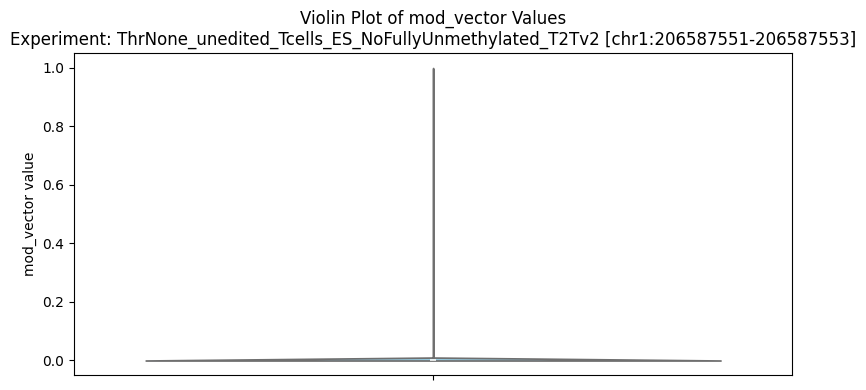

Bin 1: Range [0.0020, 0.0642) - Percentage: 74.29%
Bin 2: Range [0.0642, 0.1265) - Percentage: 6.24%
Bin 3: Range [0.1265, 0.1887) - Percentage: 3.86%
Bin 4: Range [0.1887, 0.2510) - Percentage: 3.12%
Bin 5: Range [0.2510, 0.3132) - Percentage: 2.30%
Bin 6: Range [0.3132, 0.3755) - Percentage: 1.34%
Bin 7: Range [0.3755, 0.4377) - Percentage: 1.04%
Bin 8: Range [0.4377, 0.5000) - Percentage: 1.04%
Bin 9: Range [0.5000, 0.5625) - Percentage: 0.89%
Bin 10: Range [0.5625, 0.6245) - Percentage: 0.82%
Bin 11: Range [0.6245, 0.6865) - Percentage: 0.89%
Bin 12: Range [0.6865, 0.7490) - Percentage: 0.52%
Bin 13: Range [0.7490, 0.8115) - Percentage: 0.45%
Bin 14: Range [0.8115, 0.8735) - Percentage: 0.67%
Bin 15: Range [0.8735, 0.9355) - Percentage: 0.52%
Bin 16: Range [0.9355, 0.9980) - Percentage: 2.01%


([('chr1',
   array([0.     , 0.     , 0.     , ..., 0.     , 0.     , 0.02539],
         dtype=float16),
   'CG,0',
   np.int32(206589885),
   '0bead339-5858-4332-a5fb-de51d1fa3a2f',
   np.int32(206582694),
   '+',
   array([0, 0, 0, ..., 0, 0, 1]),
   206587551,
   206587553,
   '.',
   np.float64(0.025390625)),
  ('chr1',
   array([0.     , 0.     , 0.     , ..., 0.     , 0.     , 0.01367],
         dtype=float16),
   'CG,0',
   np.int32(206589894),
   '2a387380-31a1-4eea-a27b-6addb4045d4b',
   np.int32(206582765),
   '+',
   array([0, 0, 0, ..., 0, 0, 1]),
   206587551,
   206587553,
   '.',
   np.float64(0.013671875)),
  ('chr1',
   array([0.   , 0.   , 0.   , ..., 0.   , 0.   , 0.252], dtype=float16),
   'CG,0',
   np.int32(206589945),
   'cd17f061-b00f-412a-a2eb-c22e00819ba9',
   np.int32(206582849),
   '+',
   array([0, 0, 0, ..., 0, 0, 1]),
   206587551,
   206587553,
   '.',
   np.float64(0.251953125)),
  ('chr1',
   array([0.     , 0.     , 0.     , ..., 0.     , 0.     , 0.

In [31]:
# High mC: 206584946 - 206584946+1
# Intermediate: 206585797 - 206585797+1
# Low mC (mid near TSS): 206586718 
# Low TSS start: 206586422
# Low TSS end: 206587552

region_start = 206587552-1 # 206583000   # 206586162
region_end = 206587552+1 # 206590000 # 20658619

region_str = region_chr + ":" + str(region_start) + "-" + str(region_end) #'chr1:206586162-206586192'
region_length = region_end - region_start
print("region_length", region_length)


extract_file, extract_regions, fig_plot_browser = extract_from_bam(
    experiment_name=experiment_name,
    bam_path=bam_path,
    ref_genome_file=ref_genome_path,
    output_dir=output_dir,
    regions=region_str,
    motifs=motifs,
    output_name='extracted_reads',
    threshold_mC=threshold_mC,
)
mod_vectors_noThreshold_analyze(
    experiment_name,
    extract_file, # bam_path,
    region_str,
    motifs
    )

# TSS surounding region with LOW mC 
Low TSS start: 206586422
Low TSS end: 206587552

region_length 1134
Region length: 1134
No specified number of cores requested. 24 available on machine, allocating all.
No valid base modification threshold provided. Raw probs will be saved.


          | Step 1: Identify motif locations in up_chm13v2.0.fasta   0% | 00:00

          | Step 2: Parse regions in sort_align_t2t_v2_0_trim_20241226_MR_nCATs_TcellsPrES_unedit_P2R9_passed.…

          |    0%

          | Transferring 3061 from reads.CG,0.txt into reads.combined_basemods.h5, new size 3061   0% | 00:00<…

Plot browser html figure saved to dimelo_v2_output/plot_browser_1134bps_TSS_ThrNone_unedited_Tcells_ES_NoFullyUnmethylated_T2Tv2_extract_reads_chr1:206586421-206587555.html


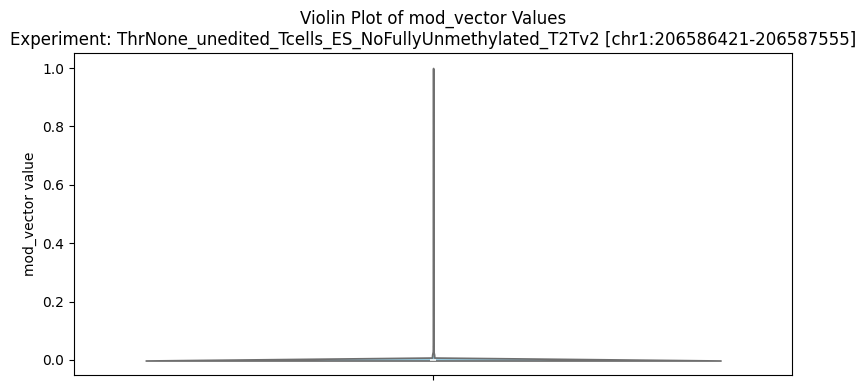

Bin 1: Range [0.0020, 0.0642) - Percentage: 74.16%
Bin 2: Range [0.0642, 0.1265) - Percentage: 6.47%
Bin 3: Range [0.1265, 0.1887) - Percentage: 3.51%
Bin 4: Range [0.1887, 0.2510) - Percentage: 2.44%
Bin 5: Range [0.2510, 0.3132) - Percentage: 1.85%
Bin 6: Range [0.3132, 0.3755) - Percentage: 1.52%
Bin 7: Range [0.3755, 0.4377) - Percentage: 1.40%
Bin 8: Range [0.4377, 0.5000) - Percentage: 1.21%
Bin 9: Range [0.5000, 0.5625) - Percentage: 1.09%
Bin 10: Range [0.5625, 0.6245) - Percentage: 1.04%
Bin 11: Range [0.6245, 0.6865) - Percentage: 0.97%
Bin 12: Range [0.6865, 0.7490) - Percentage: 0.87%
Bin 13: Range [0.7490, 0.8115) - Percentage: 0.83%
Bin 14: Range [0.8115, 0.8735) - Percentage: 0.80%
Bin 15: Range [0.8735, 0.9355) - Percentage: 0.75%
Bin 16: Range [0.9355, 0.9980) - Percentage: 1.09%


([('chr1',
   array([0.      , 0.      , 0.      , ..., 0.      , 0.      , 0.001953],
         dtype=float16),
   'CG,0',
   np.int32(206589925),
   '70716b3a-2687-497e-aec2-2437dfefae48',
   np.int32(206580887),
   '-',
   array([0, 0, 0, ..., 0, 0, 1]),
   206586421,
   206587555,
   '.',
   np.float64(0.06538955479452055)),
  ('chr1',
   array([0.      , 0.      , 0.      , ..., 0.      , 0.      , 0.009766],
         dtype=float16),
   'CG,0',
   np.int32(206589918),
   '725648dd-2bba-438a-90af-ed194c97f6a6',
   np.int32(206582393),
   '-',
   array([0, 0, 0, ..., 0, 0, 1]),
   206586421,
   206587555,
   '.',
   np.float64(0.20775462962962962)),
  ('chr1',
   array([0.      , 0.      , 0.      , ..., 0.      , 0.      , 0.001953],
         dtype=float16),
   'CG,0',
   np.int32(206589921),
   '8af377a7-1457-4903-88e4-3687a74fb360',
   np.int32(206582577),
   '-',
   array([0, 0, 0, ..., 0, 0, 1]),
   206586421,
   206587555,
   '.',
   np.float64(0.08518629807692307)),
  ('chr1',

In [32]:
# High mC: 206584946 - 206584946+1
# Intermediate: 206585797 - 206585797+1
# Low mC (mid near TSS): 206586718 
# Low TSS start: 206586422
# Low TSS end: 206587552

region_start = 206586422-1 # 206583000   # 206586162
region_end = 206587552+3 # 206590000 # 20658619

region_str = region_chr + ":" + str(region_start) + "-" + str(region_end) #'chr1:206586162-206586192'
region_length = region_end - region_start
print("region_length", region_length)


extract_file, extract_regions, fig_plot_browser = extract_from_bam(
    experiment_name="TSS_" + experiment_name,
    bam_path=bam_path,
    ref_genome_file=ref_genome_path,
    output_dir=output_dir,
    regions=region_str,
    motifs=motifs,
    output_name='extracted_reads',
    threshold_mC=threshold_mC,
)
mod_vectors_noThreshold_analyze(
    experiment_name,
    extract_file, # bam_path,
    region_str,
    motifs
    )

In [33]:
206586120 - 206585797

323

region_length 5
Region length: 5
No specified number of cores requested. 24 available on machine, allocating all.
No valid base modification threshold provided. Raw probs will be saved.


          | Step 1: Identify motif locations in up_chm13v2.0.fasta   0% | 00:00

          | Step 2: Parse regions in sort_align_t2t_v2_0_trim_20241226_MR_nCATs_TcellsPrES_unedit_P2R9_passed.…

          |    0%

          | Transferring 2518 from reads.CG,0.txt into reads.combined_basemods.h5, new size 2518   0% | 00:00<…

Plot browser html figure saved to dimelo_v2_output/plot_browser_5bps_preTSS_ThrNone_unedited_Tcells_ES_NoFullyUnmethylated_T2Tv2_extract_reads_chr1:206586118-206586123.html


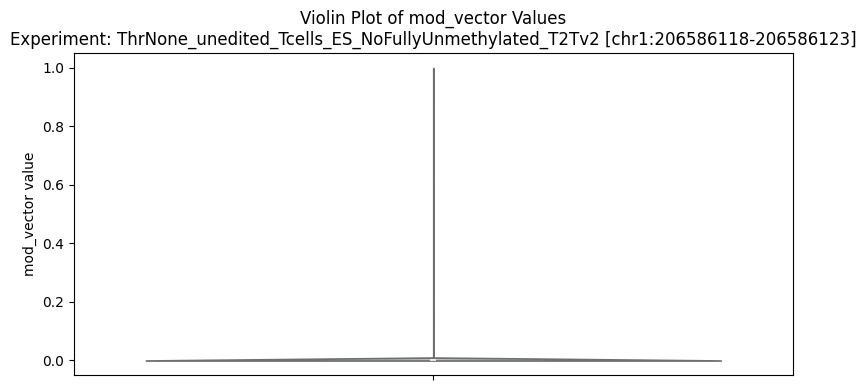

Bin 1: Range [0.0020, 0.0642) - Percentage: 58.78%
Bin 2: Range [0.0642, 0.1265) - Percentage: 7.19%
Bin 3: Range [0.1265, 0.1887) - Percentage: 3.14%
Bin 4: Range [0.1887, 0.2510) - Percentage: 2.58%
Bin 5: Range [0.2510, 0.3132) - Percentage: 1.55%
Bin 6: Range [0.3132, 0.3755) - Percentage: 1.79%
Bin 7: Range [0.3755, 0.4377) - Percentage: 1.31%
Bin 8: Range [0.4377, 0.5000) - Percentage: 1.39%
Bin 9: Range [0.5000, 0.5625) - Percentage: 0.87%
Bin 10: Range [0.5625, 0.6245) - Percentage: 1.19%
Bin 11: Range [0.6245, 0.6865) - Percentage: 0.99%
Bin 12: Range [0.6865, 0.7490) - Percentage: 1.03%
Bin 13: Range [0.7490, 0.8115) - Percentage: 1.03%
Bin 14: Range [0.8115, 0.8735) - Percentage: 1.63%
Bin 15: Range [0.8735, 0.9355) - Percentage: 2.03%
Bin 16: Range [0.9355, 0.9980) - Percentage: 13.50%


([('chr1',
   array([0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.3418], dtype=float16),
   'CG,0',
   np.int32(206589921),
   '725648dd-2bba-438a-90af-ed194c97f6a6',
   np.int32(206582396),
   '-',
   array([0, 0, 0, ..., 0, 0, 1]),
   206586118,
   206586123,
   '.',
   np.float64(0.341796875)),
  ('chr1',
   array([0.   , 0.   , 0.   , ..., 0.   , 0.   , 0.545], dtype=float16),
   'CG,0',
   np.int32(206589899),
   '8af377a7-1457-4903-88e4-3687a74fb360',
   np.int32(206582555),
   '-',
   array([0, 0, 0, ..., 0, 0, 1]),
   206586118,
   206586123,
   '.',
   np.float64(0.544921875)),
  ('chr1',
   array([0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.6855], dtype=float16),
   'CG,0',
   np.int32(206589889),
   '0bead339-5858-4332-a5fb-de51d1fa3a2f',
   np.int32(206582698),
   '+',
   array([0, 0, 0, ..., 0, 0, 1]),
   206586118,
   206586123,
   '.',
   np.float64(0.685546875)),
  ('chr1',
   array([0.     , 0.     , 0.     , ..., 0.     , 0.     , 0.01758],
         dtype=float16

In [36]:
206586120

# High mC: 206584946 - 206584946+1
# Intermediate: 206585797 - 206585797+1
# Mid mC: 206586120 
# High Mid mC: 206586020
# Low mC (mid near TSS): 206586718 
# Low TSS start: 206586422
# Low TSS end: 206587552

region_start = 206586120-2 # 206583000   # 206586162
region_end = 206586120+3 # 206590000 # 20658619

region_str = region_chr + ":" + str(region_start) + "-" + str(region_end) #'chr1:206586162-206586192'
region_length = region_end - region_start
print("region_length", region_length)


extract_file, extract_regions, fig_plot_browser = extract_from_bam(
    experiment_name="preTSS_" + experiment_name,
    bam_path=bam_path,
    ref_genome_file=ref_genome_path,
    output_dir=output_dir,
    regions=region_str,
    motifs=motifs,
    output_name='extracted_reads',
    threshold_mC=threshold_mC,
)
mod_vectors_noThreshold_analyze(
    experiment_name,
    extract_file, # bam_path,
    region_str,
    motifs
    )

region_length 1
Region length: 1
No specified number of cores requested. 24 available on machine, allocating all.
No valid base modification threshold provided. Raw probs will be saved.


          | Step 1: Identify motif locations in up_chm13v2.0.fasta   0% | 00:00

          | Step 2: Parse regions in sort_align_t2t_v2_0_trim_20241226_MR_nCATs_TcellsPrES_unedit_P2R9_passed.…

          |    0%

          | Transferring 1477 from reads.CG,0.txt into reads.combined_basemods.h5, new size 1477   0% | 00:00<…

Plot browser html figure saved to dimelo_v2_output/plot_browser_1bps_preTSS_ThrNone_unedited_Tcells_ES_NoFullyUnmethylated_T2Tv2_extract_reads_chr1:206586120-206586121.html


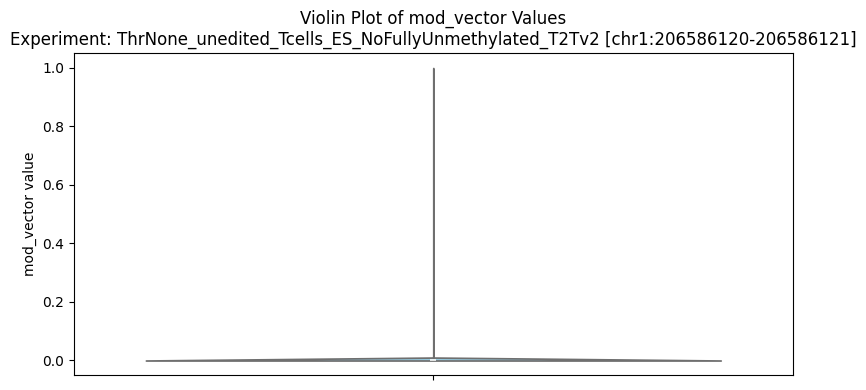

Bin 1: Range [0.0020, 0.0642) - Percentage: 48.34%
Bin 2: Range [0.0642, 0.1265) - Percentage: 10.16%
Bin 3: Range [0.1265, 0.1887) - Percentage: 4.20%
Bin 4: Range [0.1887, 0.2510) - Percentage: 3.66%
Bin 5: Range [0.2510, 0.3132) - Percentage: 2.44%
Bin 6: Range [0.3132, 0.3755) - Percentage: 2.23%
Bin 7: Range [0.3755, 0.4377) - Percentage: 2.03%
Bin 8: Range [0.4377, 0.5000) - Percentage: 2.03%
Bin 9: Range [0.5000, 0.5625) - Percentage: 1.35%
Bin 10: Range [0.5625, 0.6245) - Percentage: 1.96%
Bin 11: Range [0.6245, 0.6865) - Percentage: 1.15%
Bin 12: Range [0.6865, 0.7490) - Percentage: 1.62%
Bin 13: Range [0.7490, 0.8115) - Percentage: 1.49%
Bin 14: Range [0.8115, 0.8735) - Percentage: 2.23%
Bin 15: Range [0.8735, 0.9355) - Percentage: 2.10%
Bin 16: Range [0.9355, 0.9980) - Percentage: 13.00%


([('chr1',
   array([0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.6855], dtype=float16),
   'CG,0',
   np.int32(206589889),
   '0bead339-5858-4332-a5fb-de51d1fa3a2f',
   np.int32(206582698),
   '+',
   array([0, 0, 0, ..., 0, 0, 1]),
   206586120,
   206586121,
   '.',
   np.float64(0.685546875)),
  ('chr1',
   array([0.   , 0.   , 0.   , ..., 0.   , 0.   , 0.209], dtype=float16),
   'CG,0',
   np.int32(206589846),
   '7d30168d-6731-4643-ab9a-46eaa22bfb24',
   np.int32(206582914),
   '+',
   array([0, 0, 0, ..., 0, 0, 1]),
   206586120,
   206586121,
   '.',
   np.float64(0.208984375)),
  ('chr1',
   array([0.     , 0.     , 0.     , ..., 0.     , 0.     , 0.04883],
         dtype=float16),
   'CG,0',
   np.int32(206589870),
   'fca7b1ff-df82-4ada-9545-dd70b895f1c2',
   np.int32(206582962),
   '+',
   array([0, 0, 0, ..., 0, 0, 1]),
   206586120,
   206586121,
   '.',
   np.float64(0.048828125)),
  ('chr1',
   array([0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.2637], dtype=float16

In [38]:
# High mC: 206584946 - 206584946+1
# Intermediate: 206585797 - 206585797+1
# Mid mC: 206586120 
# High Mid mC: 206586020
# Low mC (mid near TSS): 206586718 
# Low TSS start: 206586422
# Low TSS end: 206587552

region_start = 206586120 # 206583000   # 206586162
region_end = 206586120+1 # 206590000 # 20658619

region_str = region_chr + ":" + str(region_start) + "-" + str(region_end) #'chr1:206586162-206586192'
region_length = region_end - region_start
print("region_length", region_length)


extract_file, extract_regions, fig_plot_browser = extract_from_bam(
    experiment_name="preTSS_" + experiment_name,
    bam_path=bam_path,
    ref_genome_file=ref_genome_path,
    output_dir=output_dir,
    regions=region_str,
    motifs=motifs,
    output_name='extracted_reads',
    threshold_mC=threshold_mC,
)
mod_vectors_noThreshold_analyze(
    experiment_name,
    extract_file, # bam_path,
    region_str,
    motifs
    )

region_length 2
Region length: 2
No specified number of cores requested. 24 available on machine, allocating all.
No valid base modification threshold provided. Raw probs will be saved.


          | Step 1: Identify motif locations in up_chm13v2.0.fasta   0% | 00:00

          | Step 2: Parse regions in sort_align_t2t_v2_0_trim_20241226_MR_nCATs_TcellsPrES_unedit_P2R9_passed.…

          |    0%

          | Transferring 2518 from reads.CG,0.txt into reads.combined_basemods.h5, new size 2518   0% | 00:00<…

Plot browser html figure saved to dimelo_v2_output/plot_browser_2bps_preTSS_ThrNone_unedited_Tcells_ES_NoFullyUnmethylated_T2Tv2_extract_reads_chr1:206586120-206586122.html


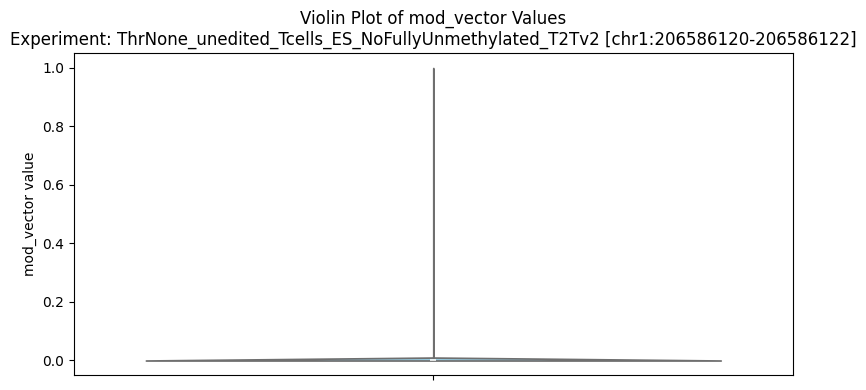

Bin 1: Range [0.0020, 0.0642) - Percentage: 58.78%
Bin 2: Range [0.0642, 0.1265) - Percentage: 7.19%
Bin 3: Range [0.1265, 0.1887) - Percentage: 3.14%
Bin 4: Range [0.1887, 0.2510) - Percentage: 2.58%
Bin 5: Range [0.2510, 0.3132) - Percentage: 1.55%
Bin 6: Range [0.3132, 0.3755) - Percentage: 1.79%
Bin 7: Range [0.3755, 0.4377) - Percentage: 1.31%
Bin 8: Range [0.4377, 0.5000) - Percentage: 1.39%
Bin 9: Range [0.5000, 0.5625) - Percentage: 0.87%
Bin 10: Range [0.5625, 0.6245) - Percentage: 1.19%
Bin 11: Range [0.6245, 0.6865) - Percentage: 0.99%
Bin 12: Range [0.6865, 0.7490) - Percentage: 1.03%
Bin 13: Range [0.7490, 0.8115) - Percentage: 1.03%
Bin 14: Range [0.8115, 0.8735) - Percentage: 1.63%
Bin 15: Range [0.8735, 0.9355) - Percentage: 2.03%
Bin 16: Range [0.9355, 0.9980) - Percentage: 13.50%


([('chr1',
   array([0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.3418], dtype=float16),
   'CG,0',
   np.int32(206589921),
   '725648dd-2bba-438a-90af-ed194c97f6a6',
   np.int32(206582396),
   '-',
   array([0, 0, 0, ..., 0, 0, 1]),
   206586120,
   206586122,
   '.',
   np.float64(0.341796875)),
  ('chr1',
   array([0.   , 0.   , 0.   , ..., 0.   , 0.   , 0.545], dtype=float16),
   'CG,0',
   np.int32(206589899),
   '8af377a7-1457-4903-88e4-3687a74fb360',
   np.int32(206582555),
   '-',
   array([0, 0, 0, ..., 0, 0, 1]),
   206586120,
   206586122,
   '.',
   np.float64(0.544921875)),
  ('chr1',
   array([0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.6855], dtype=float16),
   'CG,0',
   np.int32(206589889),
   '0bead339-5858-4332-a5fb-de51d1fa3a2f',
   np.int32(206582698),
   '+',
   array([0, 0, 0, ..., 0, 0, 1]),
   206586120,
   206586122,
   '.',
   np.float64(0.685546875)),
  ('chr1',
   array([0.     , 0.     , 0.     , ..., 0.     , 0.     , 0.01758],
         dtype=float16

In [39]:
# High mC: 206584946 - 206584946+1
# Intermediate: 206585797 - 206585797+1
# Mid mC: 206586120 
# High Mid mC: 206586020
# Low mC (mid near TSS): 206586718 
# Low TSS start: 206586422
# Low TSS end: 206587552

region_start = 206586120 # 206583000   # 206586162
region_end = 206586120+2 # 206590000 # 20658619

region_str = region_chr + ":" + str(region_start) + "-" + str(region_end) #'chr1:206586162-206586192'
region_length = region_end - region_start
print("region_length", region_length)


extract_file, extract_regions, fig_plot_browser = extract_from_bam(
    experiment_name="preTSS_" + experiment_name,
    bam_path=bam_path,
    ref_genome_file=ref_genome_path,
    output_dir=output_dir,
    regions=region_str,
    motifs=motifs,
    output_name='extracted_reads',
    threshold_mC=threshold_mC,
)
mod_vectors_noThreshold_analyze(
    experiment_name,
    extract_file, # bam_path,
    region_str,
    motifs
    )

region_length 5
Region length: 5
No specified number of cores requested. 24 available on machine, allocating all.
No valid base modification threshold provided. Raw probs will be saved.


          | Step 1: Identify motif locations in up_chm13v2.0.fasta   0% | 00:00

          | Step 2: Parse regions in sort_align_t2t_v2_0_trim_20241226_MR_nCATs_TcellsPrES_unedit_P2R9_passed.…

          |    0%

          | Transferring 2032 from reads.CG,0.txt into reads.combined_basemods.h5, new size 2032   0% | 00:00<…

Plot browser html figure saved to dimelo_v2_output/plot_browser_5bps_preTSS_ThrNone_unedited_Tcells_ES_NoFullyUnmethylated_T2Tv2_extract_reads_chr1:206585795-206585800.html


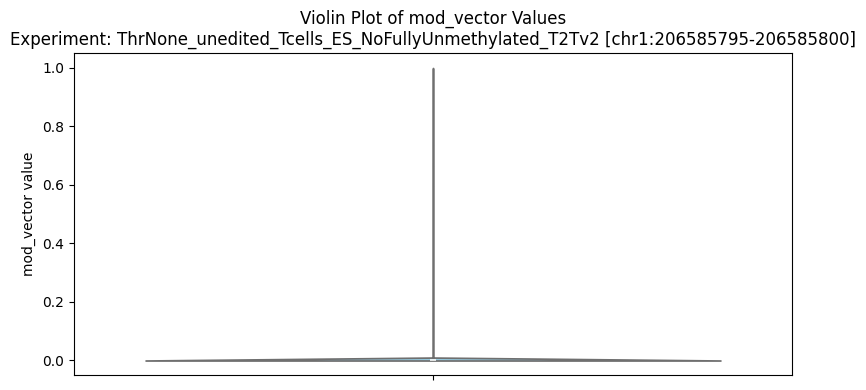

Bin 1: Range [0.0020, 0.0642) - Percentage: 20.18%
Bin 2: Range [0.0642, 0.1265) - Percentage: 1.82%
Bin 3: Range [0.1265, 0.1887) - Percentage: 1.72%
Bin 4: Range [0.1887, 0.2510) - Percentage: 0.98%
Bin 5: Range [0.2510, 0.3132) - Percentage: 1.62%
Bin 6: Range [0.3132, 0.3755) - Percentage: 0.89%
Bin 7: Range [0.3755, 0.4377) - Percentage: 0.84%
Bin 8: Range [0.4377, 0.5000) - Percentage: 1.08%
Bin 9: Range [0.5000, 0.5625) - Percentage: 1.77%
Bin 10: Range [0.5625, 0.6245) - Percentage: 1.03%
Bin 11: Range [0.6245, 0.6865) - Percentage: 1.03%
Bin 12: Range [0.6865, 0.7490) - Percentage: 2.17%
Bin 13: Range [0.7490, 0.8115) - Percentage: 2.12%
Bin 14: Range [0.8115, 0.8735) - Percentage: 3.20%
Bin 15: Range [0.8735, 0.9355) - Percentage: 6.30%
Bin 16: Range [0.9355, 0.9980) - Percentage: 53.25%


([('chr1',
   array([0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.2051], dtype=float16),
   'CG,0',
   np.int32(206589925),
   '725648dd-2bba-438a-90af-ed194c97f6a6',
   np.int32(206582400),
   '-',
   array([0, 0, 0, ..., 0, 0, 1]),
   206585795,
   206585800,
   '.',
   np.float64(0.205078125)),
  ('chr1',
   array([0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.0293], dtype=float16),
   'CG,0',
   np.int32(206589880),
   '0bead339-5858-4332-a5fb-de51d1fa3a2f',
   np.int32(206582689),
   '+',
   array([0, 0, 0, ..., 0, 0, 1]),
   206585795,
   206585800,
   '.',
   np.float64(0.029296875)),
  ('chr1',
   array([0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.7207], dtype=float16),
   'CG,0',
   np.int32(206590027),
   '7ca2b6c3-115a-4bb4-b35b-58aea4cdd606',
   np.int32(206582723),
   '-',
   array([0, 0, 0, ..., 0, 0, 1]),
   206585795,
   206585800,
   '.',
   np.float64(0.720703125)),
  ('chr1',
   array([0.   , 0.   , 0.   , ..., 0.   , 0.   , 0.834], dtype=float16),
   'CG,0',
 

In [41]:
# Start High Mid mC: 206585797

# High mC: 206584946 - 206584946+1
# Intermediate: 206585797 - 206585797+1
# Mid mC: 206586120 
# High Mid mC: 206586020
# Start High Mid mC: 206585797

# Low TSS start: 206586422
# Low mC (mid near TSS): 206586718 
# Low TSS end: 206587552

region_start = 206585797-2 # 206583000   # 206586162
region_end = 206585797 +3 # 206590000 # 20658619

region_str = region_chr + ":" + str(region_start) + "-" + str(region_end) #'chr1:206586162-206586192'
region_length = region_end - region_start
print("region_length", region_length)


extract_file, extract_regions, fig_plot_browser = extract_from_bam(
    experiment_name="preTSS_" + experiment_name,
    bam_path=bam_path,
    ref_genome_file=ref_genome_path,
    output_dir=output_dir,
    regions=region_str,
    motifs=motifs,
    output_name='extracted_reads',
    threshold_mC=threshold_mC,
)
mod_vectors_noThreshold_analyze(
    experiment_name,
    extract_file, # bam_path,
    region_str,
    motifs
    )

# middle mC pre TSS
 "partly_mC_preTSS_"  + experiment_name
206586422 - 206586120

In [11]:
206586422 - 206586120

302

region_length 304
Region length: 304
No specified number of cores requested. 24 available on machine, allocating all.
No valid base modification threshold provided. Raw probs will be saved.


          | Step 1: Identify motif locations in up_chm13v2.0.fasta   0% | 00:00

          | Step 2: Parse regions in sort_align_t2t_v2_0_trim_20241226_MR_nCATs_TcellsPrES_unedit_P2R9_passed.…

          |    0%

          | Transferring 3022 from reads.CG,0.txt into reads.combined_basemods.h5, new size 3022   0% | 00:00<…

Plot browser html figure saved to dimelo_v2_output/plot_browser_304bps_partly_mC_preTSS_ThrNone_unedited_Tcells_ES_NoFullyUnmethylated_T2Tv2_extract_reads_chr1:206586118-206586422.html


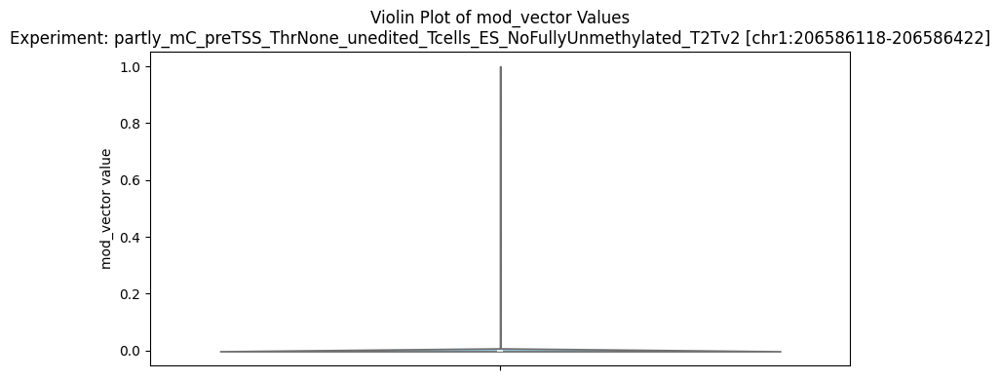

Bin 1: Range [0.0020, 0.0642) - Percentage: 50.59%
Bin 2: Range [0.0642, 0.1265) - Percentage: 6.14%
Bin 3: Range [0.1265, 0.1887) - Percentage: 3.56%
Bin 4: Range [0.1887, 0.2510) - Percentage: 2.84%
Bin 5: Range [0.2510, 0.3132) - Percentage: 2.43%
Bin 6: Range [0.3132, 0.3755) - Percentage: 2.00%
Bin 7: Range [0.3755, 0.4377) - Percentage: 1.91%
Bin 8: Range [0.4377, 0.5000) - Percentage: 1.78%
Bin 9: Range [0.5000, 0.5625) - Percentage: 1.71%
Bin 10: Range [0.5625, 0.6245) - Percentage: 1.58%
Bin 11: Range [0.6245, 0.6865) - Percentage: 1.52%
Bin 12: Range [0.6865, 0.7490) - Percentage: 1.43%
Bin 13: Range [0.7490, 0.8115) - Percentage: 1.70%
Bin 14: Range [0.8115, 0.8735) - Percentage: 1.87%
Bin 15: Range [0.8735, 0.9355) - Percentage: 2.09%
Bin 16: Range [0.9355, 0.9980) - Percentage: 16.87%


([('chr1',
   array([0.     , 0.     , 0.     , ..., 0.     , 0.     , 0.00586],
         dtype=float16),
   'CG,0',
   np.int32(206589906),
   '70716b3a-2687-497e-aec2-2437dfefae48',
   np.int32(206580868),
   '-',
   array([0, 0, 0, ..., 0, 0, 1]),
   206586118,
   206586422,
   '.',
   np.float64(0.0875)),
  ('chr1',
   array([0.     , 0.     , 0.     , ..., 0.     , 0.     , 0.01758],
         dtype=float16),
   'CG,0',
   np.int32(206589921),
   '725648dd-2bba-438a-90af-ed194c97f6a6',
   np.int32(206582396),
   '-',
   array([0, 0, 0, ..., 0, 0, 1]),
   206586118,
   206586422,
   '.',
   np.float64(0.24544270833333334)),
  ('chr1',
   array([0.      , 0.      , 0.      , ..., 0.      , 0.      , 0.001953],
         dtype=float16),
   'CG,0',
   np.int32(206589899),
   '8af377a7-1457-4903-88e4-3687a74fb360',
   np.int32(206582555),
   '-',
   array([0, 0, 0, ..., 0, 0, 1]),
   206586118,
   206586422,
   '.',
   np.float64(0.19563802083333334)),
  ('chr1',
   array([0.    , 0.    

In [12]:
experiment_name_prefix = "partly_mC_preTSS_" 

# 206586422 - 206586120

# High mC: 206584946 - 206584946+1
# High Mid mC: 206586020
# Start High Mid mC: 206585797

# Intermediate: 206585797 - 206585797+1
# Mid mC: 206586120 

# Low TSS start: 206586422
# Low mC (mid near TSS): 206586718 
# Low TSS end: 206587552

region_start = 206586120-2 # 206583000   # 206586162
region_end = 206586422 # +3 # 206590000 # 20658619

region_str = region_chr + ":" + str(region_start) + "-" + str(region_end) #'chr1:206586162-206586192'
region_length = region_end - region_start
print("region_length", region_length)


extract_file, extract_regions, fig_plot_browser = extract_from_bam(
    experiment_name= experiment_name_prefix + experiment_name,
    bam_path=bam_path,
    ref_genome_file=ref_genome_path,
    output_dir=output_dir,
    regions=region_str,
    motifs=motifs,
    output_name='extracted_reads',
    threshold_mC=threshold_mC,
)
mod_vectors_noThreshold_analyze(
    experiment_name_prefix + experiment_name,
    extract_file, # bam_path,
    region_str,
    motifs
    )

# High mC pre TSS

region_length 3120
Region length: 3120
No specified number of cores requested. 24 available on machine, allocating all.
No valid base modification threshold provided. Raw probs will be saved.


          | Step 1: Identify motif locations in up_chm13v2.0.fasta   0% | 00:00

          | Step 2: Parse regions in sort_align_t2t_v2_0_trim_20241226_MR_nCATs_TcellsPrES_unedit_P2R9_passed.…

          |    0%

          | Transferring 3310 from reads.CG,0.txt into reads.combined_basemods.h5, new size 3310   0% | 00:00<…

Plot browser html figure saved to dimelo_v2_output/plot_browser_3120bps_high_mC_preTSS_ThrNone_unedited_Tcells_ES_NoFullyUnmethylated_T2Tv2_extract_reads_chr1:206583000-206586120.html


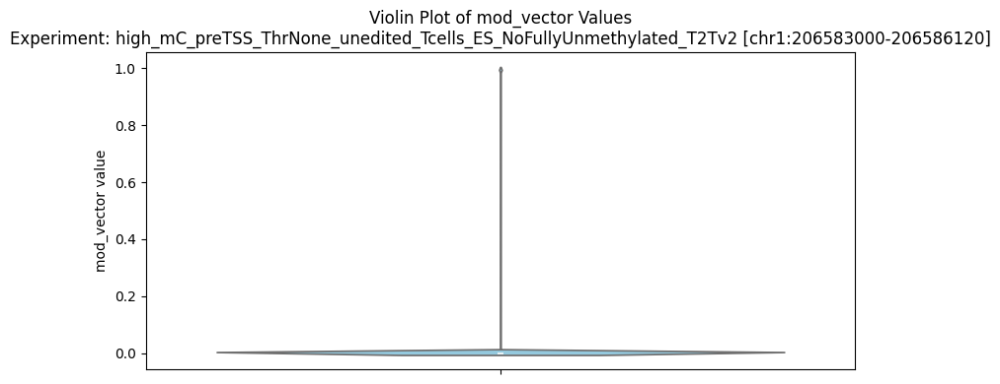

Bin 1: Range [0.0020, 0.0642) - Percentage: 6.06%
Bin 2: Range [0.0642, 0.1265) - Percentage: 0.97%
Bin 3: Range [0.1265, 0.1887) - Percentage: 0.83%
Bin 4: Range [0.1887, 0.2510) - Percentage: 0.70%
Bin 5: Range [0.2510, 0.3132) - Percentage: 0.76%
Bin 6: Range [0.3132, 0.3755) - Percentage: 0.84%
Bin 7: Range [0.3755, 0.4377) - Percentage: 0.81%
Bin 8: Range [0.4377, 0.5000) - Percentage: 0.90%
Bin 9: Range [0.5000, 0.5625) - Percentage: 1.11%
Bin 10: Range [0.5625, 0.6245) - Percentage: 1.24%
Bin 11: Range [0.6245, 0.6865) - Percentage: 1.39%
Bin 12: Range [0.6865, 0.7490) - Percentage: 1.70%
Bin 13: Range [0.7490, 0.8115) - Percentage: 1.91%
Bin 14: Range [0.8115, 0.8735) - Percentage: 2.94%
Bin 15: Range [0.8735, 0.9355) - Percentage: 4.73%
Bin 16: Range [0.9355, 0.9980) - Percentage: 73.13%


([('chr1',
   array([0.   , 0.   , 0.   , ..., 0.   , 0.   , 0.998], dtype=float16),
   'CG,0',
   np.int32(206583155),
   '83c80a8e-2405-40a1-bd1a-9d9f8863c847',
   np.int32(206572896),
   '-',
   array([0, 0, 0, ..., 0, 0, 1]),
   206583000,
   206586120,
   '.',
   np.float64(0.998046875)),
  ('chr1',
   array([0.   , 0.   , 0.   , ..., 0.   , 0.   , 0.998], dtype=float16),
   'CG,0',
   np.int32(206583151),
   'ebd335fb-50df-43df-b043-8a63d686e18c',
   np.int32(206574357),
   '-',
   array([0, 0, 0, ..., 0, 0, 1]),
   206583000,
   206586120,
   '.',
   np.float64(0.998046875)),
  ('chr1',
   array([0.  , 0.  , 0.  , ..., 0.  , 0.  , 0.99], dtype=float16),
   'CG,0',
   np.int32(206583152),
   'bb79378b-63cc-49d3-bef5-73e92dc9e412',
   np.int32(206578695),
   '-',
   array([0, 0, 0, ..., 0, 0, 1]),
   206583000,
   206586120,
   '.',
   np.float64(0.990234375)),
  ('chr1',
   array([0.   , 0.   , 0.   , ..., 0.   , 0.   , 0.537], dtype=float16),
   'CG,0',
   np.int32(206589889),
 

In [13]:
experiment_name_prefix = "high_mC_preTSS_" 

# 206586422 - 206586120

# High mC: 206584946 - 206584946+1
# High Mid mC: 206586020
# Start High Mid mC: 206585797

# Intermediate: 206585797 - 206585797+1
# Mid mC: 206586120 

# Low TSS start: 206586422
# Low mC (mid near TSS): 206586718 
# Low TSS end: 206587552

# threshold_mC = None # 0 # 0.7 # 0.9 #0.99
# FULL 7 KB WINDOW: 1:206583000-206590000
region_start = 206583000   # 206586162
region_end = 206590000 # 20658619



region_start = 206583000 # -2 # 206583000   # 206586162
region_end = 206586120 # +3 # 206590000 # 20658619

region_str = region_chr + ":" + str(region_start) + "-" + str(region_end) #'chr1:206586162-206586192'
region_length = region_end - region_start
print("region_length", region_length)


extract_file, extract_regions, fig_plot_browser = extract_from_bam(
    experiment_name= experiment_name_prefix + experiment_name,
    bam_path=bam_path,
    ref_genome_file=ref_genome_path,
    output_dir=output_dir,
    regions=region_str,
    motifs=motifs,
    output_name='extracted_reads',
    threshold_mC=threshold_mC,
)
mod_vectors_noThreshold_analyze(
    experiment_name_prefix + experiment_name,
    extract_file, # bam_path,
    region_str,
    motifs
    )

# post TSS

In [18]:
206586120 - 206590000

-3880

region_length 3880
Region length: 3880
No specified number of cores requested. 24 available on machine, allocating all.
No valid base modification threshold provided. Raw probs will be saved.


          | Step 1: Identify motif locations in up_chm13v2.0.fasta   0% | 00:00

          | Step 2: Parse regions in sort_align_t2t_v2_0_trim_20241226_MR_nCATs_TcellsPrES_unedit_P2R9_passed.…

          |    0%

          | Transferring 3260 from reads.CG,0.txt into reads.combined_basemods.h5, new size 3260   0% | 00:00<…

Plot browser html figure saved to dimelo_v2_output/plot_browser_3880bps_post_TSS_ThrNone_unedited_Tcells_ES_NoFullyUnmethylated_T2Tv2_extract_reads_chr1:206586120-206590000.html


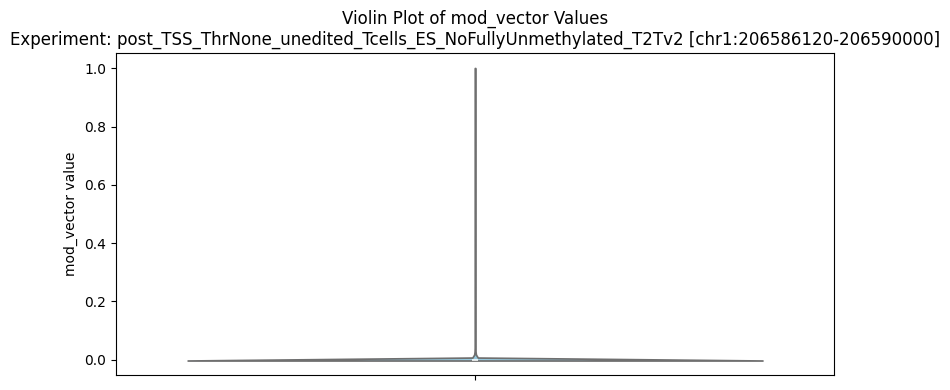

Bin 1: Range [0.0020, 0.0642) - Percentage: 65.43%
Bin 2: Range [0.0642, 0.1265) - Percentage: 5.90%
Bin 3: Range [0.1265, 0.1887) - Percentage: 3.23%
Bin 4: Range [0.1887, 0.2510) - Percentage: 2.30%
Bin 5: Range [0.2510, 0.3132) - Percentage: 1.79%
Bin 6: Range [0.3132, 0.3755) - Percentage: 1.48%
Bin 7: Range [0.3755, 0.4377) - Percentage: 1.38%
Bin 8: Range [0.4377, 0.5000) - Percentage: 1.22%
Bin 9: Range [0.5000, 0.5625) - Percentage: 1.12%
Bin 10: Range [0.5625, 0.6245) - Percentage: 1.08%
Bin 11: Range [0.6245, 0.6865) - Percentage: 1.03%
Bin 12: Range [0.6865, 0.7490) - Percentage: 0.96%
Bin 13: Range [0.7490, 0.8115) - Percentage: 1.00%
Bin 14: Range [0.8115, 0.8735) - Percentage: 1.05%
Bin 15: Range [0.8735, 0.9355) - Percentage: 1.18%
Bin 16: Range [0.9355, 0.9980) - Percentage: 9.85%


([('chr1',
   array([0.   , 0.   , 0.   , ..., 0.   , 0.   , 0.998], dtype=float16),
   'CG,0',
   np.int32(206589906),
   '70716b3a-2687-497e-aec2-2437dfefae48',
   np.int32(206580868),
   '-',
   array([0, 0, 0, ..., 0, 0, 1]),
   206586120,
   206590000,
   '.',
   np.float64(0.12288411458333333)),
  ('chr1',
   array([0.   , 0.   , 0.   , ..., 0.   , 0.   , 0.127], dtype=float16),
   'CG,0',
   np.int32(206589921),
   '725648dd-2bba-438a-90af-ed194c97f6a6',
   np.int32(206582396),
   '-',
   array([0, 0, 0, ..., 0, 0, 1]),
   206586120,
   206590000,
   '.',
   np.float64(0.2591497747747748)),
  ('chr1',
   array([0.   , 0.   , 0.   , ..., 0.   , 0.   , 0.998], dtype=float16),
   'CG,0',
   np.int32(206589899),
   '8af377a7-1457-4903-88e4-3687a74fb360',
   np.int32(206582555),
   '-',
   array([0, 0, 0, ..., 0, 0, 1]),
   206586120,
   206590000,
   '.',
   np.float64(0.22941004672897197)),
  ('chr1',
   array([0.   , 0.   , 0.   , ..., 0.   , 0.   , 0.998], dtype=float16),
   'CG,

In [19]:
experiment_name_prefix = "post_TSS_" 

# 206586422 - 206586120

# High mC: 206584946 - 206584946+1
# High Mid mC: 206586020
# Start High Mid mC: 206585797

# Intermediate: 206585797 - 206585797+1
# Mid mC: 206586120 

# Low TSS start: 206586422
# Low mC (mid near TSS): 206586718 
# Low TSS end: 206587552

# threshold_mC = None # 0 # 0.7 # 0.9 #0.99
# FULL 7 KB WINDOW: 1:206583000-206590000
# region_start = 206583000   # 206586162
# region_end = 206590000 # 20658619



region_start = 206586120 # -2 # 206583000   # 206586162
region_end =  206590000 # +3 # 206590000 # 20658619

region_str = region_chr + ":" + str(region_start) + "-" + str(region_end) #'chr1:206586162-206586192'
region_length = region_end - region_start
print("region_length", region_length)


extract_file, extract_regions, fig_plot_browser = extract_from_bam(
    experiment_name= experiment_name_prefix + experiment_name,
    bam_path=bam_path,
    ref_genome_file=ref_genome_path,
    output_dir=output_dir,
    regions=region_str,
    motifs=motifs,
    output_name='extracted_reads',
    threshold_mC=threshold_mC,
)
mod_vectors_noThreshold_analyze(
    experiment_name_prefix + experiment_name,
    extract_file, # bam_path,
    region_str,
    motifs
    )

# The intermediate pre TSS

region_length 4
Region length: 4
No specified number of cores requested. 24 available on machine, allocating all.
No valid base modification threshold provided. Raw probs will be saved.


          | Step 1: Identify motif locations in up_chm13v2.0.fasta   0% | 00:00

          | Step 2: Parse regions in sort_align_t2t_v2_0_trim_20241226_MR_nCATs_TcellsPrES_unedit_P2R9_passed.…

          |    0%

          | Transferring 2412 from reads.CG,0.txt into reads.combined_basemods.h5, new size 2412   0% | 00:00<…

Plot browser html figure saved to dimelo_v2_output/plot_browser_4bps_mid_preTSS_ThrNone_unedited_Tcells_ES_NoFullyUnmethylated_T2Tv2_extract_reads_chr1:206586018-206586022.html


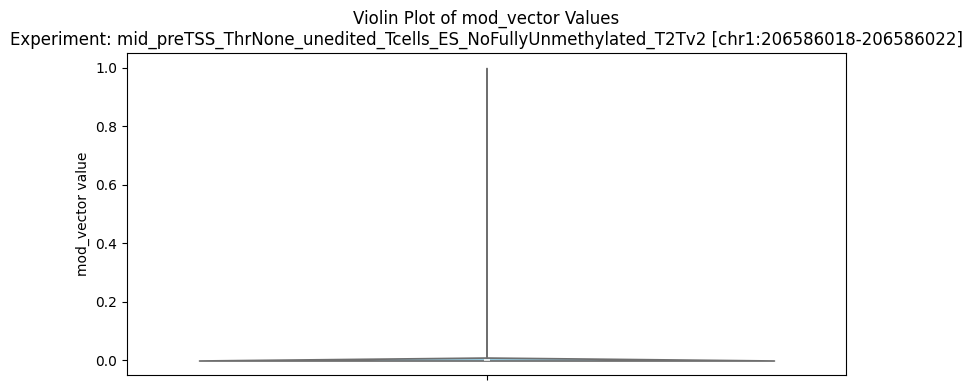

Bin 1: Range [0.0020, 0.0642) - Percentage: 35.61%
Bin 2: Range [0.0642, 0.1265) - Percentage: 5.56%
Bin 3: Range [0.1265, 0.1887) - Percentage: 3.36%
Bin 4: Range [0.1887, 0.2510) - Percentage: 1.99%
Bin 5: Range [0.2510, 0.3132) - Percentage: 1.33%
Bin 6: Range [0.3132, 0.3755) - Percentage: 1.53%
Bin 7: Range [0.3755, 0.4377) - Percentage: 1.45%
Bin 8: Range [0.4377, 0.5000) - Percentage: 1.49%
Bin 9: Range [0.5000, 0.5625) - Percentage: 1.49%
Bin 10: Range [0.5625, 0.6245) - Percentage: 1.45%
Bin 11: Range [0.6245, 0.6865) - Percentage: 1.20%
Bin 12: Range [0.6865, 0.7490) - Percentage: 2.03%
Bin 13: Range [0.7490, 0.8115) - Percentage: 1.82%
Bin 14: Range [0.8115, 0.8735) - Percentage: 2.28%
Bin 15: Range [0.8735, 0.9355) - Percentage: 3.03%
Bin 16: Range [0.9355, 0.9980) - Percentage: 34.37%


([('chr1',
   array([0.   , 0.   , 0.   , ..., 0.   , 0.   , 0.537], dtype=float16),
   'CG,0',
   np.int32(206589901),
   '70716b3a-2687-497e-aec2-2437dfefae48',
   np.int32(206580863),
   '-',
   array([0, 0, 0, ..., 0, 0, 1]),
   206586018,
   206586022,
   '.',
   np.float64(0.537109375)),
  ('chr1',
   array([0.   , 0.   , 0.   , ..., 0.   , 0.   , 0.994], dtype=float16),
   'CG,0',
   np.int32(206589922),
   '725648dd-2bba-438a-90af-ed194c97f6a6',
   np.int32(206582397),
   '-',
   array([0, 0, 0, ..., 0, 0, 1]),
   206586018,
   206586022,
   '.',
   np.float64(0.994140625)),
  ('chr1',
   array([0.     , 0.     , 0.     , ..., 0.     , 0.     , 0.00586],
         dtype=float16),
   'CG,0',
   np.int32(206589897),
   '8af377a7-1457-4903-88e4-3687a74fb360',
   np.int32(206582553),
   '-',
   array([0, 0, 0, ..., 0, 0, 1]),
   206586018,
   206586022,
   '.',
   np.float64(0.005859375)),
  ('chr1',
   array([0.   , 0.   , 0.   , ..., 0.   , 0.   , 0.951], dtype=float16),
   'CG,0'

In [20]:
experiment_name_prefix = "mid_preTSS_" 

# 206586422 - 206586120

# High mC: 206584946 - 206584946+1
# Actual Middle  mC: 206586020
# Start High Mid mC: 206585797

# Intermediate: 206585797 - 206585797+1
# Mid mC: 206586120 

# Low TSS start: 206586422
# Low mC (mid near TSS): 206586718 
# Low TSS end: 206587552

# threshold_mC = None # 0 # 0.7 # 0.9 #0.99
# FULL 7 KB WINDOW: 1:206583000-206590000
# region_start = 206583000   # 206586162
# region_end = 206590000 # 20658619



region_start = 206586020 -2 # 206583000   # 206586162
region_end =  206586020 +2 # 206590000 # 20658619

region_str = region_chr + ":" + str(region_start) + "-" + str(region_end) #'chr1:206586162-206586192'
region_length = region_end - region_start
print("region_length", region_length)


extract_file, extract_regions, fig_plot_browser = extract_from_bam(
    experiment_name= experiment_name_prefix + experiment_name,
    bam_path=bam_path,
    ref_genome_file=ref_genome_path,
    output_dir=output_dir,
    regions=region_str,
    motifs=motifs,
    output_name='extracted_reads',
    threshold_mC=threshold_mC,
)
mod_vectors_noThreshold_analyze(
    experiment_name_prefix + experiment_name,
    extract_file, # bam_path,
    region_str,
    motifs
    )

# =======================

# CRISPRoff  Silenced Edited cells from the same cells other sorted part 

In [42]:
system_info()

experiment_name = "ThrNone_CROFF90prD6_Tcells_ES_NoFullyUnmethylated_T2Tv2" 

# threshold_mC = 0.9 # 0.75 # 0.99
bam_path ="/home/michalula/data/cas9_nanopore/data/20241226_MR_nCATs_TPrES_CROFF90prD6_P2R9/pod5_converted_basecall/5mCG/to_t2t_v2_0/sort_align_t2t_v2_0_trim_20241226_MR_nCATs_TPrES_CROFF90prD6_P2R9.dna_r9.4.1_e8_sup@v3.3.5mCG.bam"

# "/home/michalula/data/cas9_nanopore/data/20241226_nCATS_K562_ZFPOFFpostSort_HIGH/pod5_converted_basecall/5mCG/to_t2t_v2_0/sort_align_t2t_v2_0_trim_20241226_nCATS_K562_ZFPOFFpostSort_HIGH_R9min_converted_fast5.dna_r9.4.1_e8_sup@v3.3.5mCG.bam"

#  "/home/michalula/data/cas9_nanopore/data/20241226_nCATS_K562_ZFPOFFpostSort_HIGH/pod5_converted_basecall/5mCG/to_t2t_v1_1/sort_align_t2t_v1_1_trim_20241226_nCATS_K562_ZFPOFFpostSort_HIGH_R9min_converted_fast5.dna_r9.4.1_e8_sup@v3.3.5mCG.bam"
# "/home/michalula/data/cas9_nanopore/data/20241226_MR_nCATs_TPrES_CROFF90prD6_P2R9/pod5_converted_basecall/5mCG/to_t2t_v1_1/sort_align_t2t_v1_1_trim_20241226_MR_nCATs_TPrES_CROFF90prD6_P2R9.dna_r9.4.1_e8_sup@v3.3.5mCG.bam"
# "/home/michalula/data/cas9_nanopore/data/20241226_MR_nCATs_TcellsPrES_unedit_P2R9/passed_fast5/5mCG/to_t2t_v1_1/sort_align_trim_20241226_MR_nCATs_TcellsPrES_unedit_P2R9_passed.dna_r9.4.1_e8_sup@v3.3.5mCG.bam"

# date_today = datetime.today().strftime('%Y-%m-%d')
# ref_genome_v1_1_file = Path('/home/michalula/data/ref_genomes/to_t2t_v1_1/chm13.draft_v1.1.fasta')
# reg_genome_version = "t2t_v1_1"
# t2t_v1_1_cd55_30bps = 'chr1:206586162-206586192'
# region_chr = 'chr1'
# region_start = 206586162
# # region_end = 206586192
# region_str = region_chr + ":" + str(region_start) + "-" + str(region_end) #'chr1:206586162-206586192'
# region_length = region_end - region_start
# print("region_length", region_length)


save_padded_reads_name_np = f"padded_reads_{experiment_name}_mCthresh{threshold_mC}_{reg_genome_version}_{region_str}_{date_today}.npy"
output_dir = create_output_directory("./dimelo_v2_output")


System: Linux
Release: 6.8.0-60-generic
Version: #63~22.04.1-Ubuntu SMP PREEMPT_DYNAMIC Tue Apr 22 19:00:15 UTC 2
Processor: x86_64
Python version: 3.11.9 | packaged by conda-forge | (main, Apr 19 2024, 18:36:13) [GCC 12.3.0]


Region length: 310
No specified number of cores requested. 24 available on machine, allocating all.
No valid base modification threshold provided. Raw probs will be saved.


          | Step 1: Identify motif locations in up_chm13v2.0.fasta   0% | 00:00

          | Step 2: Parse regions in sort_align_t2t_v2_0_trim_20241226_MR_nCATs_TPrES_CROFF90prD6_P2R9.dna_r9.…

          |    0%

          | Transferring 8883 from reads.CG,0.txt into reads.combined_basemods.h5, new size 8883   0% | 00:00<…

Plot browser html figure saved to dimelo_v2_output/plot_browser_310bps_ThrNone_CROFF90prD6_Tcells_ES_NoFullyUnmethylated_T2Tv2_extract_reads_chr1:206584106-206584416.html


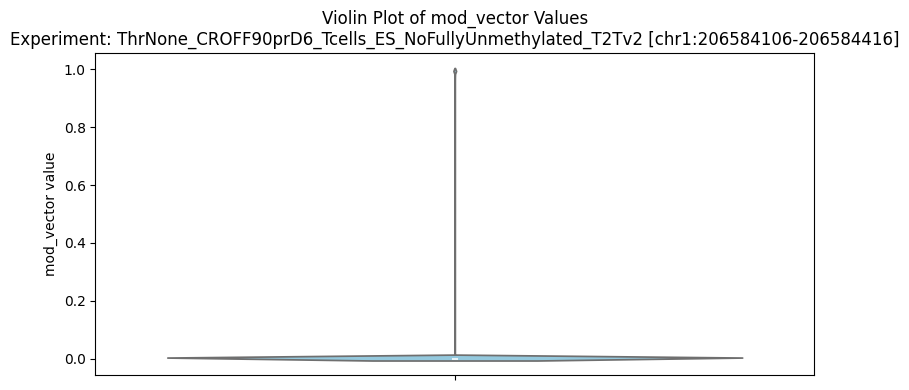

Bin 1: Range [0.0020, 0.0642) - Percentage: 2.41%
Bin 2: Range [0.0642, 0.1265) - Percentage: 0.96%
Bin 3: Range [0.1265, 0.1887) - Percentage: 0.91%
Bin 4: Range [0.1887, 0.2510) - Percentage: 0.98%
Bin 5: Range [0.2510, 0.3132) - Percentage: 1.03%
Bin 6: Range [0.3132, 0.3755) - Percentage: 1.09%
Bin 7: Range [0.3755, 0.4377) - Percentage: 1.24%
Bin 8: Range [0.4377, 0.5000) - Percentage: 1.36%
Bin 9: Range [0.5000, 0.5625) - Percentage: 1.57%
Bin 10: Range [0.5625, 0.6245) - Percentage: 1.78%
Bin 11: Range [0.6245, 0.6865) - Percentage: 2.14%
Bin 12: Range [0.6865, 0.7490) - Percentage: 2.52%
Bin 13: Range [0.7490, 0.8115) - Percentage: 3.22%
Bin 14: Range [0.8115, 0.8735) - Percentage: 4.33%
Bin 15: Range [0.8735, 0.9355) - Percentage: 6.95%
Bin 16: Range [0.9355, 0.9980) - Percentage: 67.51%


([('chr1',
   array([0.   , 0.   , 0.   , ..., 0.   , 0.   , 0.998], dtype=float16),
   'CG,0',
   np.int32(206589971),
   '754dc068-0d8f-40f3-a327-ef67c7216615',
   np.int32(206577022),
   '-',
   array([0, 0, 0, ..., 0, 0, 1]),
   206584106,
   206584416,
   '.',
   np.float64(0.9588068181818182)),
  ('chr1',
   array([0.   , 0.   , 0.   , ..., 0.   , 0.   , 0.912], dtype=float16),
   'CG,0',
   np.int32(206589937),
   'f0352207-698a-4801-a32e-11b587cd6725',
   np.int32(206578458),
   '-',
   array([0, 0, 0, ..., 0, 0, 1]),
   206584106,
   206584416,
   '.',
   np.float64(0.9609375)),
  ('chr1',
   array([0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.9785], dtype=float16),
   'CG,0',
   np.int32(206589856),
   'cecb95ee-eaa9-47a1-a1a8-aded06c90dc0',
   np.int32(206580204),
   '-',
   array([0, 0, 0, ..., 0, 0, 1]),
   206584106,
   206584416,
   '.',
   np.float64(0.6058238636363636)),
  ('chr1',
   array([0.   , 0.   , 0.   , ..., 0.   , 0.   , 0.916], dtype=float16),
   'CG,0',
 

In [12]:
# motifs=['CG,0']
# ref_seq_list = get_reference_sequence(ref_genome_v1_1_file, region_chr, region_start, region_end)

extract_file, extract_regions, fig_plot_browser = extract_from_bam(
    experiment_name=experiment_name,
    bam_path=bam_path,
    ref_genome_file=ref_genome_path,
    output_dir=output_dir,
    regions=region_str,
    motifs=motifs,
    output_name='extracted_reads',
    threshold_mC=threshold_mC,
)

mod_vectors_noThreshold_analyze(
    experiment_name,
    extract_file, # bam_path,
    region_str,
    motifs
    )

In [13]:
# if extract_file:
#     reads_df, regions_dict = process_extracted_reads(extract_file, region_str, motifs, ref_seq_list)
#     visualize_data(reads_df)

#     padded_reads = create_padded_reads(reads_df, regions_dict, region_length)
#     if padded_reads is not None:
#         plot_padded_reads(padded_reads, ref_seq_list)
#         save_padded_reads(padded_reads, output_dir, save_padded_reads_name_np)

keep_unmethylated_reads = False
if extract_file:
    if keep_unmethylated_reads:
        reads_df, regions_dict = process_extracted_reads(extract_file, region_str, motifs, ref_seq_list)
        visualize_data(reads_df)

        padded_reads = create_padded_reads(reads_df, regions_dict, region_length)
    else:
        reads_df, regions_dict = process_extracted_reads_no_fully_unmethylated(extract_file, region_str, motifs, ref_seq_list)
        visualize_data(reads_df)
        padded_reads = create_padded_reads_no_fully_unmethylated(reads_df, regions_dict, region_length)
    if padded_reads is not None:
        plot_padded_reads(padded_reads, ref_seq_list)
        save_padded_reads(padded_reads, output_dir, save_padded_reads_name_np)

Error processing extracted reads: No threshold has been applied to this .h5 single read data. You must provide a threshold using the thresh parameter in order to extract binarized modification arrays.
Error in visualization: 'NoneType' object has no attribute 'copy'
Error creating padded reads matrix: 'NoneType' object is not subscriptable


region_length 30
Region length: 30
No specified number of cores requested. 24 available on machine, allocating all.
No valid base modification threshold provided. Raw probs will be saved.


          | Step 1: Identify motif locations in up_chm13v2.0.fasta   0% | 00:00

          | Step 2: Parse regions in sort_align_t2t_v2_0_trim_20241226_MR_nCATs_TPrES_CROFF90prD6_P2R9.dna_r9.…

          |    0%

          | Transferring 7643 from reads.CG,0.txt into reads.combined_basemods.h5, new size 7643   0% | 00:00<…

Plot browser html figure saved to dimelo_v2_output/plot_browser_30bps_ThrNone_CROFF90prD6_Tcells_ES_NoFullyUnmethylated_T2Tv2_extract_reads_chr1:206586162-206586192.html


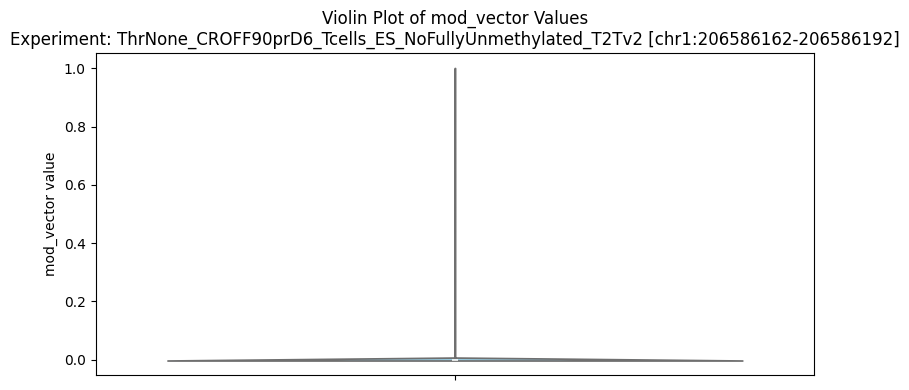

Bin 1: Range [0.0020, 0.0642) - Percentage: 10.44%
Bin 2: Range [0.0642, 0.1265) - Percentage: 2.50%
Bin 3: Range [0.1265, 0.1887) - Percentage: 1.94%
Bin 4: Range [0.1887, 0.2510) - Percentage: 1.75%
Bin 5: Range [0.2510, 0.3132) - Percentage: 1.66%
Bin 6: Range [0.3132, 0.3755) - Percentage: 1.59%
Bin 7: Range [0.3755, 0.4377) - Percentage: 1.71%
Bin 8: Range [0.4377, 0.5000) - Percentage: 1.85%
Bin 9: Range [0.5000, 0.5625) - Percentage: 1.96%
Bin 10: Range [0.5625, 0.6245) - Percentage: 2.16%
Bin 11: Range [0.6245, 0.6865) - Percentage: 2.27%
Bin 12: Range [0.6865, 0.7490) - Percentage: 2.78%
Bin 13: Range [0.7490, 0.8115) - Percentage: 3.11%
Bin 14: Range [0.8115, 0.8735) - Percentage: 4.36%
Bin 15: Range [0.8735, 0.9355) - Percentage: 6.04%
Bin 16: Range [0.9355, 0.9980) - Percentage: 53.87%


([('chr1',
   array([0.    , 0.    , 0.    , ..., 0.8496, 0.    , 0.998 ], dtype=float16),
   'CG,0',
   np.int32(206589952),
   '754dc068-0d8f-40f3-a327-ef67c7216615',
   np.int32(206577003),
   '-',
   array([0, 0, 0, ..., 1, 0, 1]),
   206586162,
   206586192,
   '.',
   np.float64(0.4809027777777778)),
  ('chr1',
   array([0.    , 0.    , 0.    , ..., 0.6855, 0.    , 0.9824], dtype=float16),
   'CG,0',
   np.int32(206589943),
   'f0352207-698a-4801-a32e-11b587cd6725',
   np.int32(206578464),
   '-',
   array([0, 0, 0, ..., 1, 0, 1]),
   206586162,
   206586192,
   '.',
   np.float64(0.6744791666666666)),
  ('chr1',
   array([0.     , 0.     , 0.     , ..., 0.8887 , 0.     , 0.04883],
         dtype=float16),
   'CG,0',
   np.int32(206589872),
   'cecb95ee-eaa9-47a1-a1a8-aded06c90dc0',
   np.int32(206580220),
   '-',
   array([0, 0, 0, ..., 1, 0, 1]),
   206586162,
   206586192,
   '.',
   np.float64(0.7272135416666666)),
  ('chr1',
   array([0.   , 0.   , 0.   , ..., 0.   , 0.   , 

In [14]:
# threshold_mC = None # 0 # 0.7 # 0.9 #0.99

region_chr = 'chr1'
# 30 bps:
region_start = 206586162
region_end = 206586192

# # FULL 7 KB WINDOW: 1:206583000-206590000
# region_start = 206583000   # 206586162
# region_end = 206590000 # 20658619


region_str = region_chr + ":" + str(region_start) + "-" + str(region_end) #'chr1:206586162-206586192'
region_length = region_end - region_start
print("region_length", region_length)


extract_file, extract_regions, fig_plot_browser = extract_from_bam(
    experiment_name=experiment_name,
    bam_path=bam_path,
    ref_genome_file=ref_genome_path,
    output_dir=output_dir,
    regions=region_str,
    motifs=motifs,
    output_name='extracted_reads',
    threshold_mC=threshold_mC,
)

mod_vectors_noThreshold_analyze(
    experiment_name,
    extract_file, # bam_path,
    region_str,
    motifs
    )

In [15]:
experiment_name

'ThrNone_CROFF90prD6_Tcells_ES_NoFullyUnmethylated_T2Tv2'

In [16]:
bam_path

'/home/michalula/data/cas9_nanopore/data/20241226_MR_nCATs_TPrES_CROFF90prD6_P2R9/pod5_converted_basecall/5mCG/to_t2t_v2_0/sort_align_t2t_v2_0_trim_20241226_MR_nCATs_TPrES_CROFF90prD6_P2R9.dna_r9.4.1_e8_sup@v3.3.5mCG.bam'

In [17]:

# Expend window size
expand_window_size = 50 # 50 #500 #1500 # 0 
expand_window_size
print("Expend window size by 2 * ", expand_window_size)
region_start = 206586162 - expand_window_size
region_end = 206586192 + expand_window_size + 1


region_str = region_chr + ":" + str(region_start) + "-" + str(region_end) #'chr1:206586162-206586192'
region_length = region_end - region_start
print("region_length", region_length)


extract_file, extract_regions, fig_plot_browser = extract_from_bam(
    experiment_name=experiment_name,
    bam_path=bam_path,
    ref_genome_file=ref_genome_path,
    output_dir=output_dir,
    regions=region_str,
    motifs=motifs,
    output_name='extracted_reads',
    threshold_mC=threshold_mC,
)
mod_vectors_noThreshold_analyze(
    experiment_name,
    extract_file, # bam_path,
    region_str,
    motifs
    )

Expend window size by 2 *  50
region_length 131
Region length: 131
No specified number of cores requested. 24 available on machine, allocating all.
No valid base modification threshold provided. Raw probs will be saved.


          | Step 1: Identify motif locations in up_chm13v2.0.fasta   0% | 00:00

          | Step 2: Parse regions in sort_align_t2t_v2_0_trim_20241226_MR_nCATs_TPrES_CROFF90prD6_P2R9.dna_r9.…

          |    0%

          | Transferring 8229 from reads.CG,0.txt into reads.combined_basemods.h5, new size 8229   0% | 00:00<…

Plot browser html figure saved to dimelo_v2_output/plot_browser_131bps_ThrNone_CROFF90prD6_Tcells_ES_NoFullyUnmethylated_T2Tv2_extract_reads_chr1:206586112-206586243.html


Bin 1: Range [0.0020, 0.0642) - Percentage: 14.50%
Bin 2: Range [0.0642, 0.1265) - Percentage: 2.87%
Bin 3: Range [0.1265, 0.1887) - Percentage: 2.05%
Bin 4: Range [0.1887, 0.2510) - Percentage: 1.79%
Bin 5: Range [0.2510, 0.3132) - Percentage: 1.62%
Bin 6: Range [0.3132, 0.3755) - Percentage: 1.56%
Bin 7: Range [0.3755, 0.4377) - Percentage: 1.64%
Bin 8: Range [0.4377, 0.5000) - Percentage: 1.77%
Bin 9: Range [0.5000, 0.5625) - Percentage: 1.83%
Bin 10: Range [0.5625, 0.6245) - Percentage: 2.00%
Bin 11: Range [0.6245, 0.6865) - Percentage: 2.07%
Bin 12: Range [0.6865, 0.7490) - Percentage: 2.57%
Bin 13: Range [0.7490, 0.8115) - Percentage: 2.91%
Bin 14: Range [0.8115, 0.8735) - Percentage: 4.03%
Bin 15: Range [0.8735, 0.9355) - Percentage: 5.56%
Bin 16: Range [0.9355, 0.9980) - Percentage: 51.22%


([('chr1',
   array([0.      , 0.      , 0.      , ..., 0.      , 0.      , 0.001953],
         dtype=float16),
   'CG,0',
   np.int32(206589953),
   '754dc068-0d8f-40f3-a327-ef67c7216615',
   np.int32(206577004),
   '-',
   array([0, 0, 0, ..., 0, 0, 1]),
   206586112,
   206586243,
   '.',
   np.float64(0.3934659090909091)),
  ('chr1',
   array([0.     , 0.     , 0.     , ..., 0.     , 0.     , 0.00586],
         dtype=float16),
   'CG,0',
   np.int32(206589942),
   'f0352207-698a-4801-a32e-11b587cd6725',
   np.int32(206578463),
   '-',
   array([0, 0, 0, ..., 0, 0, 1]),
   206586112,
   206586243,
   '.',
   np.float64(0.6427556818181818)),
  ('chr1',
   array([0.     , 0.     , 0.     , ..., 0.8887 , 0.     , 0.04883],
         dtype=float16),
   'CG,0',
   np.int32(206589872),
   'cecb95ee-eaa9-47a1-a1a8-aded06c90dc0',
   np.int32(206580220),
   '-',
   array([0, 0, 0, ..., 1, 0, 1]),
   206586112,
   206586243,
   '.',
   np.float64(0.7272135416666666)),
  ('chr1',
   array([0.  

In [18]:
"""
Main pipeline for processing and visualizing CpG units on forward and reverse strands 
"""
try:
    # Define constants
    # experiment_name = "unedited_T_primerES_nCATS"
    # save_folder_path = output_dir # "/home/michalula/code/epiCausality/epiCode/notebooks/dimelo_v2_output"
    # save_padded_reads_name_np = "padded_reads.npy"
    # ref_genome_file = "/home/michalula/data/ref_genomes/to_t2t_v1_1/chm13.draft_v1.1.fasta"
    # region_chr = "chr1"
    # region_start = 206586162
    # region_end = 206586192

    # Process pipeline
    CGs_all, C_fwd_df, G_revs_df, padded_reads_df, CG_pair_idx, CG_coordinates = analize_forward_reverse_CGs_pipeline(
        experiment_name=experiment_name, save_folder_path=output_dir, 
        save_padded_reads_name_np=save_padded_reads_name_np, 
        ref_genome_file=ref_genome_path, region_chr=region_chr, region_start=region_start, region_end=region_end
    )

    print("Pipeline executed successfully (analize_forward_reverse_CGs_pipeline function)")
    # return CGs_all, C_fwd_df, G_revs_df, padded_reads_df

except Exception as e:
    print(f"Error in main pipeline (analize_forward_reverse_CGs_pipeline function): {e}")


Error loading padded reads: [Errno 2] No such file or directory: 'dimelo_v2_output/padded_reads_ThrNone_CROFF90prD6_Tcells_ES_NoFullyUnmethylated_T2Tv2_mCthreshNone_t2t_v2_0_chr1:206583000-206590000_2025-04-01.npy'
Error in process pipeline: [Errno 2] No such file or directory: 'dimelo_v2_output/padded_reads_ThrNone_CROFF90prD6_Tcells_ES_NoFullyUnmethylated_T2Tv2_mCthreshNone_t2t_v2_0_chr1:206583000-206590000_2025-04-01.npy'
Error in main pipeline (analize_forward_reverse_CGs_pipeline function): [Errno 2] No such file or directory: 'dimelo_v2_output/padded_reads_ThrNone_CROFF90prD6_Tcells_ES_NoFullyUnmethylated_T2Tv2_mCthreshNone_t2t_v2_0_chr1:206583000-206590000_2025-04-01.npy'


region_length 300
Region length: 300
No specified number of cores requested. 24 available on machine, allocating all.
No valid base modification threshold provided. Raw probs will be saved.


          | Step 1: Identify motif locations in up_chm13v2.0.fasta   0% | 00:00

          | Step 2: Parse regions in sort_align_t2t_v2_0_trim_20241226_MR_nCATs_TPrES_CROFF90prD6_P2R9.dna_r9.…

          |    0%

          | Transferring 8379 from reads.CG,0.txt into reads.combined_basemods.h5, new size 8379   0% | 00:00<…

Plot browser html figure saved to dimelo_v2_output/plot_browser_300bps_ThrNone_CROFF90prD6_Tcells_ES_NoFullyUnmethylated_T2Tv2_extract_reads_chr1:206586400-206586700.html


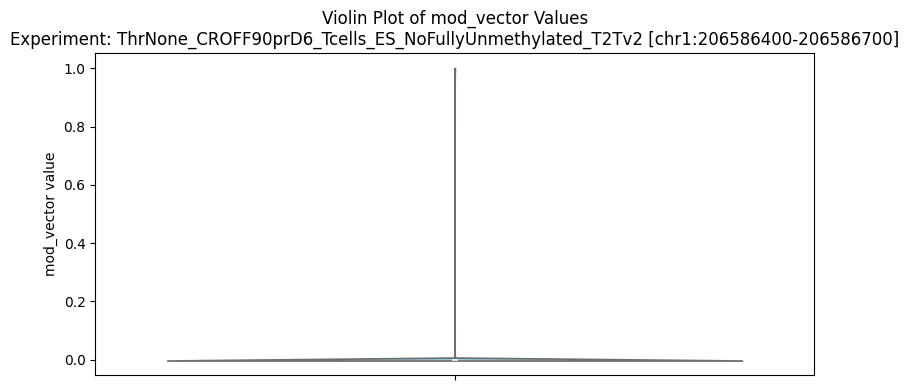

Bin 1: Range [0.0020, 0.0642) - Percentage: 22.75%
Bin 2: Range [0.0642, 0.1265) - Percentage: 3.07%
Bin 3: Range [0.1265, 0.1887) - Percentage: 1.95%
Bin 4: Range [0.1887, 0.2510) - Percentage: 1.59%
Bin 5: Range [0.2510, 0.3132) - Percentage: 1.44%
Bin 6: Range [0.3132, 0.3755) - Percentage: 1.29%
Bin 7: Range [0.3755, 0.4377) - Percentage: 1.40%
Bin 8: Range [0.4377, 0.5000) - Percentage: 1.46%
Bin 9: Range [0.5000, 0.5625) - Percentage: 1.48%
Bin 10: Range [0.5625, 0.6245) - Percentage: 1.74%
Bin 11: Range [0.6245, 0.6865) - Percentage: 1.85%
Bin 12: Range [0.6865, 0.7490) - Percentage: 2.20%
Bin 13: Range [0.7490, 0.8115) - Percentage: 2.57%
Bin 14: Range [0.8115, 0.8735) - Percentage: 3.21%
Bin 15: Range [0.8735, 0.9355) - Percentage: 4.78%
Bin 16: Range [0.9355, 0.9980) - Percentage: 47.23%


([('chr1',
   array([0.   , 0.   , 0.   , ..., 0.   , 0.   , 0.998], dtype=float16),
   'CG,0',
   np.int32(206589969),
   '754dc068-0d8f-40f3-a327-ef67c7216615',
   np.int32(206577020),
   '-',
   array([0, 0, 0, ..., 0, 0, 1]),
   206586400,
   206586700,
   '.',
   np.float64(0.6999080882352942)),
  ('chr1',
   array([0.   , 0.   , 0.   , ..., 0.   , 0.   , 0.998], dtype=float16),
   'CG,0',
   np.int32(206589942),
   'f0352207-698a-4801-a32e-11b587cd6725',
   np.int32(206578463),
   '-',
   array([0, 0, 0, ..., 0, 0, 1]),
   206586400,
   206586700,
   '.',
   np.float64(0.4078125)),
  ('chr1',
   array([0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.7793], dtype=float16),
   'CG,0',
   np.int32(206589878),
   'cecb95ee-eaa9-47a1-a1a8-aded06c90dc0',
   np.int32(206580226),
   '-',
   array([0, 0, 0, ..., 0, 0, 1]),
   206586400,
   206586700,
   '.',
   np.float64(0.7099609375)),
  ('chr1',
   array([0.   , 0.   , 0.   , ..., 0.   , 0.   , 0.998], dtype=float16),
   'CG,0',
   np.i

In [17]:
# Region length: 300 - TSS
region_start = 206586400 # 206583000   # 206586162
region_end = 206586700 # 206590000 # 20658619

region_str = region_chr + ":" + str(region_start) + "-" + str(region_end) #'chr1:206586162-206586192'
region_length = region_end - region_start
print("region_length", region_length)


extract_file, extract_regions, fig_plot_browser = extract_from_bam(
    experiment_name=experiment_name,
    bam_path=bam_path,
    ref_genome_file=ref_genome_path,
    output_dir=output_dir,
    regions=region_str,
    motifs=motifs,
    output_name='extracted_reads',
    threshold_mC=threshold_mC,
)
mod_vectors_noThreshold_analyze(
    experiment_name,
    extract_file, # bam_path,
    region_str,
    motifs
    )

region_length 310
Region length: 310
No specified number of cores requested. 24 available on machine, allocating all.
No valid base modification threshold provided. Raw probs will be saved.


          | Step 1: Identify motif locations in up_chm13v2.0.fasta   0% | 00:00

          | Step 2: Parse regions in sort_align_t2t_v2_0_trim_20241226_MR_nCATs_TPrES_CROFF90prD6_P2R9.dna_r9.…

          |    0%

          | Transferring 8883 from reads.CG,0.txt into reads.combined_basemods.h5, new size 8883   0% | 00:00<…

Plot browser html figure saved to dimelo_v2_output/plot_browser_310bps_ThrNone_CROFF90prD6_Tcells_ES_NoFullyUnmethylated_T2Tv2_extract_reads_chr1:206584106-206584416.html


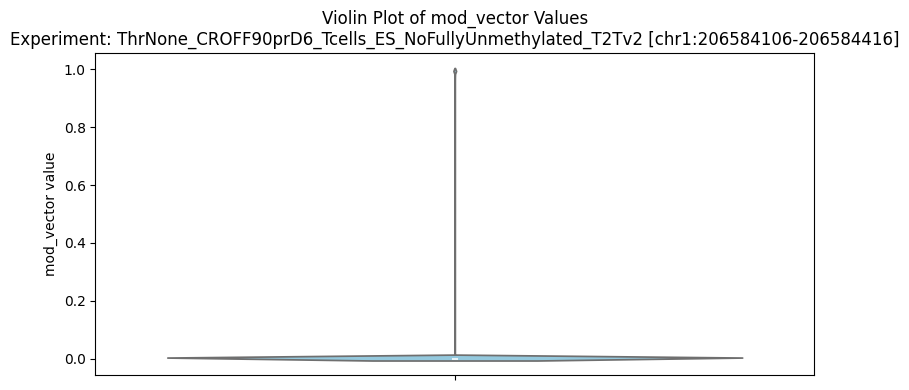

Bin 1: Range [0.0020, 0.0642) - Percentage: 2.41%
Bin 2: Range [0.0642, 0.1265) - Percentage: 0.96%
Bin 3: Range [0.1265, 0.1887) - Percentage: 0.91%
Bin 4: Range [0.1887, 0.2510) - Percentage: 0.98%
Bin 5: Range [0.2510, 0.3132) - Percentage: 1.03%
Bin 6: Range [0.3132, 0.3755) - Percentage: 1.09%
Bin 7: Range [0.3755, 0.4377) - Percentage: 1.24%
Bin 8: Range [0.4377, 0.5000) - Percentage: 1.36%
Bin 9: Range [0.5000, 0.5625) - Percentage: 1.57%
Bin 10: Range [0.5625, 0.6245) - Percentage: 1.78%
Bin 11: Range [0.6245, 0.6865) - Percentage: 2.14%
Bin 12: Range [0.6865, 0.7490) - Percentage: 2.52%
Bin 13: Range [0.7490, 0.8115) - Percentage: 3.22%
Bin 14: Range [0.8115, 0.8735) - Percentage: 4.33%
Bin 15: Range [0.8735, 0.9355) - Percentage: 6.95%
Bin 16: Range [0.9355, 0.9980) - Percentage: 67.51%


([('chr1',
   array([0.   , 0.   , 0.   , ..., 0.   , 0.   , 0.998], dtype=float16),
   'CG,0',
   np.int32(206589971),
   '754dc068-0d8f-40f3-a327-ef67c7216615',
   np.int32(206577022),
   '-',
   array([0, 0, 0, ..., 0, 0, 1]),
   206584106,
   206584416,
   '.',
   np.float64(0.9588068181818182)),
  ('chr1',
   array([0.   , 0.   , 0.   , ..., 0.   , 0.   , 0.912], dtype=float16),
   'CG,0',
   np.int32(206589937),
   'f0352207-698a-4801-a32e-11b587cd6725',
   np.int32(206578458),
   '-',
   array([0, 0, 0, ..., 0, 0, 1]),
   206584106,
   206584416,
   '.',
   np.float64(0.9609375)),
  ('chr1',
   array([0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.9785], dtype=float16),
   'CG,0',
   np.int32(206589856),
   'cecb95ee-eaa9-47a1-a1a8-aded06c90dc0',
   np.int32(206580204),
   '-',
   array([0, 0, 0, ..., 0, 0, 1]),
   206584106,
   206584416,
   '.',
   np.float64(0.6058238636363636)),
  ('chr1',
   array([0.   , 0.   , 0.   , ..., 0.   , 0.   , 0.916], dtype=float16),
   'CG,0',
 

In [18]:
# Highly methylated:

# Region length: 310
region_start = 206584106 # 206583000   # 206586162
region_end = 206584416 # 206587600 # 206590000 # 20658619

region_str = region_chr + ":" + str(region_start) + "-" + str(region_end) #'chr1:206586162-206586192'
region_length = region_end - region_start
print("region_length", region_length)


extract_file, extract_regions, fig_plot_browser = extract_from_bam(
    experiment_name=experiment_name,
    bam_path=bam_path,
    ref_genome_file=ref_genome_path,
    output_dir=output_dir,
    regions=region_str,
    motifs=motifs,
    output_name='extracted_reads',
    threshold_mC=threshold_mC,
)
mod_vectors_noThreshold_analyze(
    experiment_name,
    extract_file, # bam_path,
    region_str,
    motifs
    )

region_length 2200
Region length: 2200
No specified number of cores requested. 24 available on machine, allocating all.
No valid base modification threshold provided. Raw probs will be saved.


          | Step 1: Identify motif locations in up_chm13v2.0.fasta   0% | 00:00

          | Step 2: Parse regions in sort_align_t2t_v2_0_trim_20241226_MR_nCATs_TPrES_CROFF90prD6_P2R9.dna_r9.…

          |    0%

          | Transferring 8877 from reads.CG,0.txt into reads.combined_basemods.h5, new size 8877   0% | 00:00<…

Plot browser html figure saved to dimelo_v2_output/plot_browser_2200bps_ThrNone_CROFF90prD6_Tcells_ES_NoFullyUnmethylated_T2Tv2_extract_reads_chr1:206585400-206587600.html


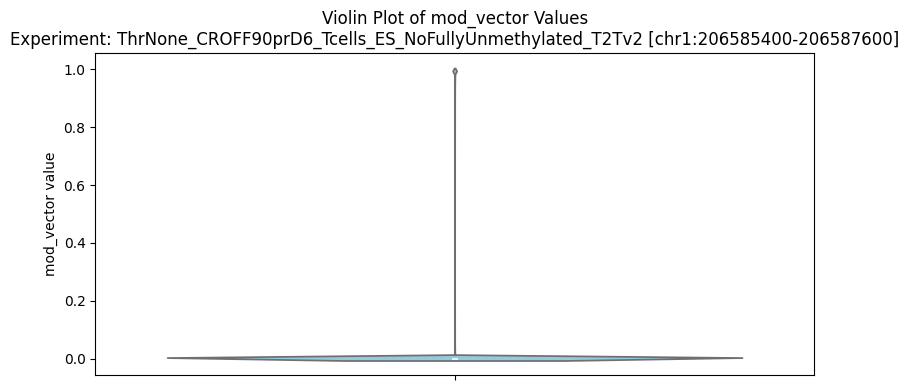

Bin 1: Range [0.0020, 0.0642) - Percentage: 21.64%
Bin 2: Range [0.0642, 0.1265) - Percentage: 3.28%
Bin 3: Range [0.1265, 0.1887) - Percentage: 2.19%
Bin 4: Range [0.1887, 0.2510) - Percentage: 1.78%
Bin 5: Range [0.2510, 0.3132) - Percentage: 1.62%
Bin 6: Range [0.3132, 0.3755) - Percentage: 1.51%
Bin 7: Range [0.3755, 0.4377) - Percentage: 1.53%
Bin 8: Range [0.4377, 0.5000) - Percentage: 1.59%
Bin 9: Range [0.5000, 0.5625) - Percentage: 1.68%
Bin 10: Range [0.5625, 0.6245) - Percentage: 1.84%
Bin 11: Range [0.6245, 0.6865) - Percentage: 1.98%
Bin 12: Range [0.6865, 0.7490) - Percentage: 2.31%
Bin 13: Range [0.7490, 0.8115) - Percentage: 2.71%
Bin 14: Range [0.8115, 0.8735) - Percentage: 3.50%
Bin 15: Range [0.8735, 0.9355) - Percentage: 5.03%
Bin 16: Range [0.9355, 0.9980) - Percentage: 45.83%


([('chr1',
   array([0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.4785], dtype=float16),
   'CG,0',
   np.int32(206589912),
   '088d15a5-d5b9-4d03-885a-e08f52c26df8',
   np.int32(206574001),
   '-',
   array([0, 0, 0, ..., 0, 0, 1]),
   206585400,
   206587600,
   '.',
   np.float64(0.507421875)),
  ('chr1',
   array([0.      , 0.      , 0.      , ..., 0.      , 0.      , 0.001953],
         dtype=float16),
   'CG,0',
   np.int32(206589953),
   '754dc068-0d8f-40f3-a327-ef67c7216615',
   np.int32(206577004),
   '-',
   array([0, 0, 0, ..., 0, 0, 1]),
   206585400,
   206587600,
   '.',
   np.float64(0.5995639534883721)),
  ('chr1',
   array([0.   , 0.   , 0.   , ..., 0.   , 0.   , 0.998], dtype=float16),
   'CG,0',
   np.int32(206589943),
   'f0352207-698a-4801-a32e-11b587cd6725',
   np.int32(206578464),
   '-',
   array([0, 0, 0, ..., 0, 0, 1]),
   206585400,
   206587600,
   '.',
   np.float64(0.5902423469387755)),
  ('chr1',
   array([0.     , 0.     , 0.     , ..., 0.     , 0.    

In [19]:
# Region length: 2200 near TSS 
region_start = 206585400 # 206583000   # 206586162
region_end = 206587600 # 206590000 # 20658619

region_str = region_chr + ":" + str(region_start) + "-" + str(region_end) #'chr1:206586162-206586192'
region_length = region_end - region_start
print("region_length", region_length)


extract_file, extract_regions, fig_plot_browser = extract_from_bam(
    experiment_name=experiment_name,
    bam_path=bam_path,
    ref_genome_file=ref_genome_path,
    output_dir=output_dir,
    regions=region_str,
    motifs=motifs,
    output_name='extracted_reads',
    threshold_mC=threshold_mC,
)
mod_vectors_noThreshold_analyze(
    experiment_name,
    extract_file, # bam_path,
    region_str,
    motifs
    )

region_length 7000
Region length: 7000
No specified number of cores requested. 24 available on machine, allocating all.
No valid base modification threshold provided. Raw probs will be saved.


          | Step 1: Identify motif locations in up_chm13v2.0.fasta   0% | 00:00

          | Step 2: Parse regions in sort_align_t2t_v2_0_trim_20241226_MR_nCATs_TPrES_CROFF90prD6_P2R9.dna_r9.…

          |    0%

          | Transferring 10199 from reads.CG,0.txt into reads.combined_basemods.h5, new size 10199   0% | 00:0…

Plot browser html figure saved to dimelo_v2_output/plot_browser_7000bps_ThrNone_CROFF90prD6_Tcells_ES_NoFullyUnmethylated_T2Tv2_extract_reads_chr1:206583000-206590000.html


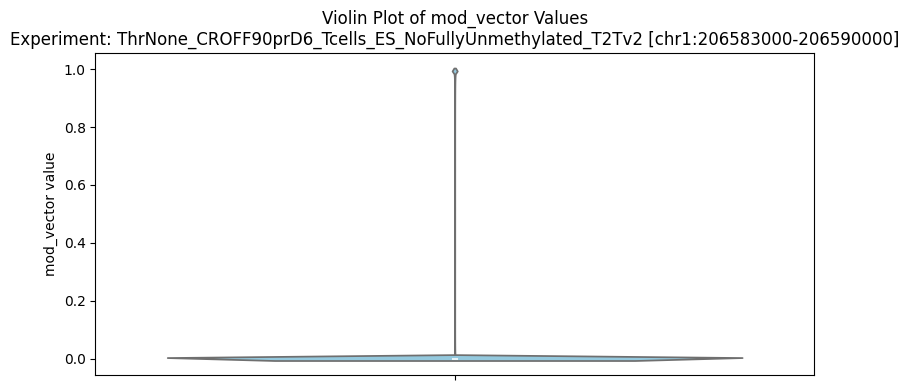

Bin 1: Range [0.0020, 0.0642) - Percentage: 18.02%
Bin 2: Range [0.0642, 0.1265) - Percentage: 2.77%
Bin 3: Range [0.1265, 0.1887) - Percentage: 1.88%
Bin 4: Range [0.1887, 0.2510) - Percentage: 1.56%
Bin 5: Range [0.2510, 0.3132) - Percentage: 1.43%
Bin 6: Range [0.3132, 0.3755) - Percentage: 1.37%
Bin 7: Range [0.3755, 0.4377) - Percentage: 1.40%
Bin 8: Range [0.4377, 0.5000) - Percentage: 1.46%
Bin 9: Range [0.5000, 0.5625) - Percentage: 1.56%
Bin 10: Range [0.5625, 0.6245) - Percentage: 1.73%
Bin 11: Range [0.6245, 0.6865) - Percentage: 1.89%
Bin 12: Range [0.6865, 0.7490) - Percentage: 2.22%
Bin 13: Range [0.7490, 0.8115) - Percentage: 2.64%
Bin 14: Range [0.8115, 0.8735) - Percentage: 3.47%
Bin 15: Range [0.8735, 0.9355) - Percentage: 5.14%
Bin 16: Range [0.9355, 0.9980) - Percentage: 51.44%


([('chr1',
   array([0.   , 0.   , 0.   , ..., 0.   , 0.   , 0.998], dtype=float16),
   'CG,0',
   np.int32(206583235),
   '03525963-94ac-43b7-90a8-933c4b9c2936',
   np.int32(206562336),
   '-',
   array([0, 0, 0, ..., 0, 0, 1]),
   206583000,
   206590000,
   '.',
   np.float64(0.998046875)),
  ('chr1',
   array([0.   , 0.   , 0.   , ..., 0.   , 0.   , 0.998], dtype=float16),
   'CG,0',
   np.int32(206583178),
   'bceba770-6a9f-419e-bbc1-30b2469146de',
   np.int32(206563455),
   '-',
   array([0, 0, 0, ..., 0, 0, 1]),
   206583000,
   206590000,
   '.',
   np.float64(0.998046875)),
  ('chr1',
   array([0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.9434], dtype=float16),
   'CG,0',
   np.int32(206583174),
   '1c58bc37-637c-40b4-8414-918873e0ca23',
   np.int32(206565304),
   '-',
   array([0, 0, 0, ..., 0, 0, 1]),
   206583000,
   206590000,
   '.',
   np.float64(0.943359375)),
  ('chr1',
   array([0.   , 0.   , 0.   , ..., 0.   , 0.   , 0.998], dtype=float16),
   'CG,0',
   np.int32(2

In [43]:
# threshold_mC = None # 0 # 0.7 # 0.9 #0.99
# FULL 7 KB WINDOW: 1:206583000-206590000
region_start = 206583000   # 206586162
region_end = 206590000 # 20658619


region_str = region_chr + ":" + str(region_start) + "-" + str(region_end) #'chr1:206586162-206586192'
region_length = region_end - region_start
print("region_length", region_length)


extract_file, extract_regions, fig_plot_browser = extract_from_bam(
    experiment_name=experiment_name,
    bam_path=bam_path,
    ref_genome_file=ref_genome_path,
    output_dir=output_dir,
    regions=region_str,
    motifs=motifs,
    output_name='extracted_reads',
    threshold_mC=threshold_mC,
)
mod_vectors_noThreshold_analyze(
    experiment_name,
    extract_file, # bam_path,
    region_str,
    motifs
    )

region_length 5
Region length: 5
No specified number of cores requested. 24 available on machine, allocating all.
No valid base modification threshold provided. Raw probs will be saved.


          | Step 1: Identify motif locations in up_chm13v2.0.fasta   0% | 00:00

          | Step 2: Parse regions in sort_align_t2t_v2_0_trim_20241226_MR_nCATs_TPrES_CROFF90prD6_P2R9.dna_r9.…

          |    0%

          | Transferring 6002 from reads.CG,0.txt into reads.combined_basemods.h5, new size 6002   0% | 00:00<…

Plot browser html figure saved to dimelo_v2_output/plot_browser_5bps_preTSS_ThrNone_CROFF90prD6_Tcells_ES_NoFullyUnmethylated_T2Tv2_extract_reads_chr1:206586118-206586123.html


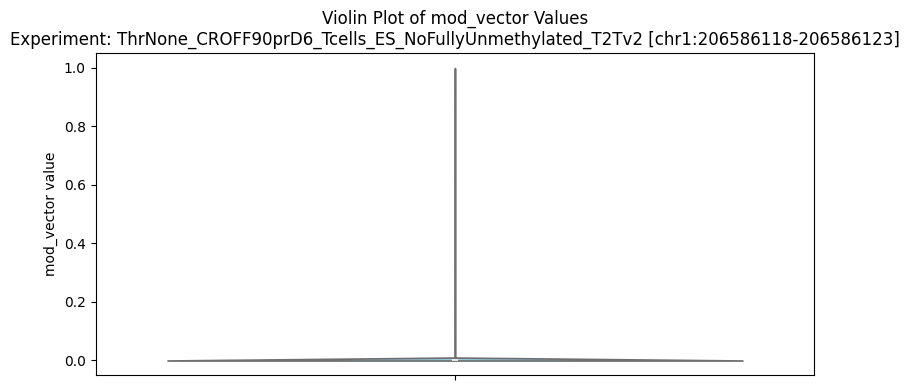

Bin 1: Range [0.0020, 0.0642) - Percentage: 43.39%
Bin 2: Range [0.0642, 0.1265) - Percentage: 6.53%
Bin 3: Range [0.1265, 0.1887) - Percentage: 3.57%
Bin 4: Range [0.1887, 0.2510) - Percentage: 2.78%
Bin 5: Range [0.2510, 0.3132) - Percentage: 1.98%
Bin 6: Range [0.3132, 0.3755) - Percentage: 1.87%
Bin 7: Range [0.3755, 0.4377) - Percentage: 1.72%
Bin 8: Range [0.4377, 0.5000) - Percentage: 1.93%
Bin 9: Range [0.5000, 0.5625) - Percentage: 1.53%
Bin 10: Range [0.5625, 0.6245) - Percentage: 1.68%
Bin 11: Range [0.6245, 0.6865) - Percentage: 1.40%
Bin 12: Range [0.6865, 0.7490) - Percentage: 1.87%
Bin 13: Range [0.7490, 0.8115) - Percentage: 2.50%
Bin 14: Range [0.8115, 0.8735) - Percentage: 2.82%
Bin 15: Range [0.8735, 0.9355) - Percentage: 3.55%
Bin 16: Range [0.9355, 0.9980) - Percentage: 20.89%


([('chr1',
   array([0.      , 0.      , 0.      , ..., 0.      , 0.      , 0.001953],
         dtype=float16),
   'CG,0',
   np.int32(206589953),
   '754dc068-0d8f-40f3-a327-ef67c7216615',
   np.int32(206577004),
   '-',
   array([0, 0, 0, ..., 0, 0, 1]),
   206586118,
   206586123,
   '.',
   np.float64(0.001953125)),
  ('chr1',
   array([0.   , 0.   , 0.   , ..., 0.   , 0.   , 0.994], dtype=float16),
   'CG,0',
   np.int32(206589942),
   'f0352207-698a-4801-a32e-11b587cd6725',
   np.int32(206578463),
   '-',
   array([0, 0, 0, ..., 0, 0, 1]),
   206586118,
   206586123,
   '.',
   np.float64(0.994140625)),
  ('chr1',
   array([0.     , 0.     , 0.     , ..., 0.     , 0.     , 0.00586],
         dtype=float16),
   'CG,0',
   np.int32(206589975),
   '1efc455b-9076-422f-bd0e-f918e57bb3ab',
   np.int32(206580690),
   '-',
   array([0, 0, 0, ..., 0, 0, 1]),
   206586118,
   206586123,
   '.',
   np.float64(0.005859375)),
  ('chr1',
   array([0.    , 0.    , 0.    , ..., 0.    , 0.    , 0

In [44]:
# Mid mC: 206586120 - non consistenstly methylated

# 206586020

# High mC: 206584946 - 206584946+1
# Intermediate: 206585797 - 206585797+1
# Mid mC: 206586120 
# High Mid mC: 206586020
# Start High Mid mC: 206585797

# Low TSS start: 206586422
# Low mC (mid near TSS): 206586718 
# Low TSS end: 206587552

region_start = 206586120-2 # 206583000   # 206586162
region_end = 206586120 +3 # 206590000 # 20658619

region_str = region_chr + ":" + str(region_start) + "-" + str(region_end) #'chr1:206586162-206586192'
region_length = region_end - region_start
print("region_length", region_length)


extract_file, extract_regions, fig_plot_browser = extract_from_bam(
    experiment_name="preTSS_" + experiment_name,
    bam_path=bam_path,
    ref_genome_file=ref_genome_path,
    output_dir=output_dir,
    regions=region_str,
    motifs=motifs,
    output_name='extracted_reads',
    threshold_mC=threshold_mC,
)
mod_vectors_noThreshold_analyze(
    experiment_name,
    extract_file, # bam_path,
    region_str,
    motifs
    )

region_length 5
Region length: 5
No specified number of cores requested. 24 available on machine, allocating all.
No valid base modification threshold provided. Raw probs will be saved.


          | Step 1: Identify motif locations in up_chm13v2.0.fasta   0% | 00:00

          | Step 2: Parse regions in sort_align_t2t_v2_0_trim_20241226_MR_nCATs_TPrES_CROFF90prD6_P2R9.dna_r9.…

          |    0%

          | Transferring 5995 from reads.CG,0.txt into reads.combined_basemods.h5, new size 5995   0% | 00:00<…

Plot browser html figure saved to dimelo_v2_output/plot_browser_5bps_preTSS_ThrNone_CROFF90prD6_Tcells_ES_NoFullyUnmethylated_T2Tv2_extract_reads_chr1:206586018-206586023.html


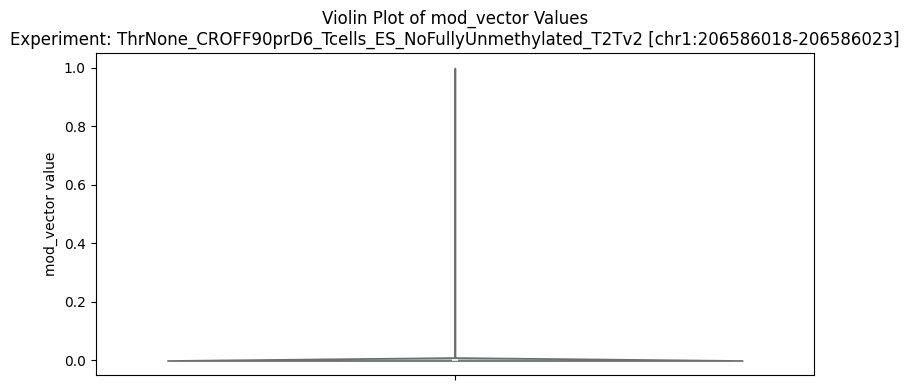

Bin 1: Range [0.0020, 0.0642) - Percentage: 23.19%
Bin 2: Range [0.0642, 0.1265) - Percentage: 3.29%
Bin 3: Range [0.1265, 0.1887) - Percentage: 2.39%
Bin 4: Range [0.1887, 0.2510) - Percentage: 1.67%
Bin 5: Range [0.2510, 0.3132) - Percentage: 1.43%
Bin 6: Range [0.3132, 0.3755) - Percentage: 1.47%
Bin 7: Range [0.3755, 0.4377) - Percentage: 1.42%
Bin 8: Range [0.4377, 0.5000) - Percentage: 1.90%
Bin 9: Range [0.5000, 0.5625) - Percentage: 1.62%
Bin 10: Range [0.5625, 0.6245) - Percentage: 1.97%
Bin 11: Range [0.6245, 0.6865) - Percentage: 1.80%
Bin 12: Range [0.6865, 0.7490) - Percentage: 2.35%
Bin 13: Range [0.7490, 0.8115) - Percentage: 2.27%
Bin 14: Range [0.8115, 0.8735) - Percentage: 3.20%
Bin 15: Range [0.8735, 0.9355) - Percentage: 6.01%
Bin 16: Range [0.9355, 0.9980) - Percentage: 44.04%


([('chr1',
   array([0.     , 0.     , 0.     , ..., 0.     , 0.     , 0.02148],
         dtype=float16),
   'CG,0',
   np.int32(206589953),
   '754dc068-0d8f-40f3-a327-ef67c7216615',
   np.int32(206577004),
   '-',
   array([0, 0, 0, ..., 0, 0, 1]),
   206586018,
   206586023,
   '.',
   np.float64(0.021484375)),
  ('chr1',
   array([0.   , 0.   , 0.   , ..., 0.   , 0.   , 0.584], dtype=float16),
   'CG,0',
   np.int32(206589942),
   'f0352207-698a-4801-a32e-11b587cd6725',
   np.int32(206578463),
   '-',
   array([0, 0, 0, ..., 0, 0, 1]),
   206586018,
   206586023,
   '.',
   np.float64(0.583984375)),
  ('chr1',
   array([0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.4277], dtype=float16),
   'CG,0',
   np.int32(206589872),
   'cecb95ee-eaa9-47a1-a1a8-aded06c90dc0',
   np.int32(206580220),
   '-',
   array([0, 0, 0, ..., 0, 0, 1]),
   206586018,
   206586023,
   '.',
   np.float64(0.427734375)),
  ('chr1',
   array([0.  , 0.  , 0.  , ..., 0.  , 0.  , 0.99], dtype=float16),
   'CG,0'

In [45]:
# Mid mC: 206586020 - highly non consistenstly methylated

# 206586020

# High mC: 206584946 - 206584946+1
# Intermediate: 206585797 - 206585797+1
# Mid mC: 206586120 
# High Mid mC: 206586020
# Start High Mid mC: 206585797

# Low TSS start: 206586422
# Low mC (mid near TSS): 206586718 
# Low TSS end: 206587552

region_start = 206586020-2 # 206583000   # 206586162
region_end = 206586020 +3 # 206590000 # 20658619

region_str = region_chr + ":" + str(region_start) + "-" + str(region_end) #'chr1:206586162-206586192'
region_length = region_end - region_start
print("region_length", region_length)


extract_file, extract_regions, fig_plot_browser = extract_from_bam(
    experiment_name="preTSS_" + experiment_name,
    bam_path=bam_path,
    ref_genome_file=ref_genome_path,
    output_dir=output_dir,
    regions=region_str,
    motifs=motifs,
    output_name='extracted_reads',
    threshold_mC=threshold_mC,
)
mod_vectors_noThreshold_analyze(
    experiment_name,
    extract_file, # bam_path,
    region_str,
    motifs
    )